# Capstone Project :- Computer Vision Group 2

<b>• DOMAIN: Automotive Surveillance.</b>

<b>• CONTEXT:</b>

Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is
predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of
the car, type, colour, number plates etc.

<b>• DATA DESCRIPTION:</b>

The Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing
images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, e.g.
2012 Tesla Model S or 2012 BMW M3 coupe.

<b>Data description:</b>

‣ Train Images: Consists of real images of cars as per the make and year of the car.

‣ Test Images: Consists of real images of cars as per the make and year of the car.

‣ Train Annotation: Consists of bounding box region for training images.

‣ Test Annotation: Consists of bounding box region for testing images.

Dataset has been attached along with this project. Please use the same for this capstone project. Original link to the dataset for your reference only: https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder [ for your
reference only ]

Reference: 3D Object Representations for Fine-Grained Categorisation, Jonathan Krause, Michael Stark, Jia Deng, Li Fei-Fei 4th IEEE Workshop on 3D Representation and Recognition, at ICCV 2013 (3dRR-13). Sydney, Australia. Dec. 8, 2013.

<b>• PROJECT OBJECTIVE:</b> Design a DL based car identification model.

<b>• PROJECT TASK: [ Score: 100 points]</b>

<b>1. Milestone 1: [ Score: 40 points]</b>

‣ Input: Context and Dataset

<b>‣ Process:</b>

‣ Step 1: Import the data. [ 3 points ]

‣ Step 2: Map training and testing images to its classes. [ 6 points ]

‣ Step 3: Map training and testing images to its annotations. [ 6 points ]

‣ Step 4: Display images with bounding box. [ 5 points ]

‣ Step 5: Design, train and test basic CNN models to classify the car. [ 10 points ]

‣ Step 6: Interim report [ 10 points ]

‣ Submission: Interim report, Jupyter Notebook with all the steps in Milestone-1

## Milestone 1

### Step 1: Importing the Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
from os import path
# from google.colab import drive
import cv2
import random

import tensorflow as tf

C:\Users\LENOVO\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
# Check if the tensorflow is configured to utilise the GPU
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
# To extend the GPU memory
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)
# To clear GPU memory
# from numba import cuda
# device = cuda.get_current_device()
# device.reset()
# or
# import tensorflow as tf
# tf.keras.backend.clear_session()

### Step 2: Data Extraction

In [ ]:
# Defining the path at which the Annotations zip file is kept
zip_path = 'C:\\Users\\adity\\Downloads\\capstone\\Annotations.zip'

In [ ]:
# Exporting the Annotations from the zip file
from zipfile import ZipFile
with ZipFile(zip_path,'r') as zip:
  zip.extractall('C:\\Users\\adity\\Downloads\\capstone\\')

In [ ]:
# Defining the path at which the zip file containing the images is kept
zip_path_2 = 'C:\\Users\\adity\\Downloads\\capstone\\Car+Images.zip'

In [ ]:
# Exporting the images from the zip file
from zipfile import ZipFile
with ZipFile(zip_path_2,'r') as zip:
  zip.extractall('C:\\Users\\adity\\Downloads\\capstone\\')

### Step 3: Data Loading

In [ ]:
# Step 1 & 2) Map the images from train folder with train and test labels to form a DataFrame. [6 Marks]
# Data Extraction
import os
import cv2
import pandas as pd

dataset = 'C:\\Users\\adity\\Downloads\\capstone\\Car Images\\'
X = []              # X will contain the image in the form of numpy N dimensional array
y = []              # y will contain the labels of the images
z = []              # z will tell if the image belongs to either the train or test dataset
h = []              # h will tell about the height of the image
w = []              # w will tell about the width of the image
c = []              # c will tell about the no of channels of the image
id = []             # id will be extracted from the image name to uniquely identify an image
path = []           # specifies the path of the image
count = 0

# list all folders inside train directory
for i in os.listdir(dataset):
    print("Folder :-",i)
    if i!= '.DS_Store':   #Specific to Mac
      for j in os.listdir(os.path.join(dataset, i)):
        print("Sub Folder :-",j)
        if j!= '.DS_Store':   #Specific to Mac
          for l in os.listdir(os.path.join(dataset, i, j)):
            # read each image inside train directory one by one
            k = os.path.splitext(l)
            id.append(k[0])
            dummy = cv2.imread(os.path.join(dataset, i, j, l))
#             dummy = cv2.resize(dummy, (224, 224))   # Resizing can be any number - 128 is just kept for standard reference
            X.append(dummy)
            y.append(j)
            z.append(i)
            h.append(dummy.shape[0])
            w.append(dummy.shape[1])
            c.append(dummy.shape[2])
            path.append(os.path.join(dataset, i, j, l))
            count+=1
print("Count :-",count)

Folder :- .DS_Store
Folder :- Test Images
Sub Folder :- Acura Integra Type R 2001
Sub Folder :- Acura RL Sedan 2012
Sub Folder :- Acura TL Sedan 2012
Sub Folder :- Acura TL Type-S 2008
Sub Folder :- Acura TSX Sedan 2012
Sub Folder :- Acura ZDX Hatchback 2012
Sub Folder :- AM General Hummer SUV 2000
Sub Folder :- Aston Martin V8 Vantage Convertible 2012
Sub Folder :- Aston Martin V8 Vantage Coupe 2012
Sub Folder :- Aston Martin Virage Convertible 2012
Sub Folder :- Aston Martin Virage Coupe 2012
Sub Folder :- Audi 100 Sedan 1994
Sub Folder :- Audi 100 Wagon 1994
Sub Folder :- Audi A5 Coupe 2012
Sub Folder :- Audi R8 Coupe 2012
Sub Folder :- Audi RS 4 Convertible 2008
Sub Folder :- Audi S4 Sedan 2007
Sub Folder :- Audi S4 Sedan 2012
Sub Folder :- Audi S5 Convertible 2012
Sub Folder :- Audi S5 Coupe 2012
Sub Folder :- Audi S6 Sedan 2011
Sub Folder :- Audi TT Hatchback 2011
Sub Folder :- Audi TT RS Coupe 2012
Sub Folder :- Audi TTS Coupe 2012
Sub Folder :- Audi V8 Sedan 1994
Sub Folder :- 

In [ ]:
# Creating a Dataframe consisting of information about the images
data_df = pd.DataFrame({'id':id, 'image':X, 'label':y, 'dataset':z, 'height':h, 'width':w, 'n_channels' :c, 'path' :path})
data_df.head()

,id,image,label,dataset,height,width,n_channels,path
0,00128,"[[[110, 143, 122], [91, 124, 103], [79, 115, 9...",Acura Integra Type R 2001,Test Images,600,900,3,C:\Users\adity\Downloads\capstone\Car Images\T...
1,00130,"[[[96, 94, 94], [97, 95, 95], [99, 97, 97], [9...",Acura Integra Type R 2001,Test Images,458,800,3,C:\Users\adity\Downloads\capstone\Car Images\T...
2,00386,"[[[0, 0, 0], [0, 0, 0], [4, 4, 4], [0, 0, 0], ...",Acura Integra Type R 2001,Test Images,533,800,3,C:\Users\adity\Downloads\capstone\Car Images\T...
3,00565,"[[[253, 253, 253], [253, 253, 253], [253, 253,...",Acura Integra Type R 2001,Test Images,380,545,3,C:\Users\adity\Downloads\capstone\Car Images\T...
4,00711,"[[[95, 79, 72], [95, 79, 72], [95, 79, 72], [9...",Acura Integra Type R 2001,Test Images,409,799,3,C:\Users\adity\Downloads\capstone\Car Images\T...


In [ ]:
# Creating test and train datasets
test_df = data_df[data_df['dataset']=='Test Images']
train_df = data_df[data_df['dataset']=='Train Images']

### Step 4: Basic Data Analysis

In [ ]:
print("No of classes in Train :-",len(next(os.walk('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Train Images\\'))[1]))
print("No of classes in Test :-",len(next(os.walk('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\'))[1]))

No of classes in Train :- 196
No of classes in Test :- 196


In [ ]:
train_df['label'].nunique()

196

In [ ]:
test_df['label'].nunique()

196

In [ ]:
train_df['label'].unique() == test_df['label'].unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

- *Observations:-*

-> The above statement checks if the unique values in the training match with the unique values in the test

In [ ]:
# Extracting the unique label names of the cars from the train dataset
unique_labels = list(train_df['label'].unique())

In [ ]:
unique_labels

['Acura Integra Type R 2001',
 'Acura RL Sedan 2012',
 'Acura TL Sedan 2012',
 'Acura TL Type-S 2008',
 'Acura TSX Sedan 2012',
 'Acura ZDX Hatchback 2012',
 'AM General Hummer SUV 2000',
 'Aston Martin V8 Vantage Convertible 2012',
 'Aston Martin V8 Vantage Coupe 2012',
 'Aston Martin Virage Convertible 2012',
 'Aston Martin Virage Coupe 2012',
 'Audi 100 Sedan 1994',
 'Audi 100 Wagon 1994',
 'Audi A5 Coupe 2012',
 'Audi R8 Coupe 2012',
 'Audi RS 4 Convertible 2008',
 'Audi S4 Sedan 2007',
 'Audi S4 Sedan 2012',
 'Audi S5 Convertible 2012',
 'Audi S5 Coupe 2012',
 'Audi S6 Sedan 2011',
 'Audi TT Hatchback 2011',
 'Audi TT RS Coupe 2012',
 'Audi TTS Coupe 2012',
 'Audi V8 Sedan 1994',
 'Bentley Arnage Sedan 2009',
 'Bentley Continental Flying Spur Sedan 2007',
 'Bentley Continental GT Coupe 2007',
 'Bentley Continental GT Coupe 2012',
 'Bentley Continental Supersports Conv. Convertible 2012',
 'Bentley Mulsanne Sedan 2011',
 'BMW 1 Series Convertible 2012',
 'BMW 1 Series Coupe 2012',


In [ ]:
# Extracting car name from the car_names.csv
car_names_csv = pd.read_csv("Car+names+and+make.csv", header=None, names=['tags'])

In [ ]:
car_names_csv.head()

,tags
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


In [ ]:
# Checking if the unique labels of cars csv match with the unique values from sub folder names inside train folder
set(car_names_csv['tags']) == set(train_df['label'])

False

In [ ]:
# Checking if the unique labels of cars csv match with the unique values from sub folder names inside test folder
set(car_names_csv['tags']) == set(test_df['label'])

False

- *Observations:-*

-> There seems to be some disrepancy between the label names provided in csv vs label names from sub folder

In [ ]:
set(train_df['label']) == set(test_df['label'])

True

In [ ]:
# Checking the discrepency between car names csv vs train labels
set(car_names_csv['tags']) ^ set(train_df['label'])

{'Ram C-V Cargo Van Minivan 2012', 'Ram C/V Cargo Van Minivan 2012'}

- *Observations:-*

-> The discrepeny seems to be negligible as the name of the car is seems to be same

In [ ]:
car_names_csv[car_names_csv['tags']=='Ram C-V Cargo Van Minivan 2012']

,tags


In [ ]:
train_df[train_df['label']=='Ram C/V Cargo Van Minivan 2012']

,id,image,label,dataset,height,width,n_channels,path


In [ ]:
# Specifying the annotation csv path
annot_path = "C:\\Users\\adity\\Downloads\\capstone\\Annotations\\"

In [ ]:
# Reading the test annotation csv
test_annot_df = pd.read_csv(annot_path+"Test Annotation.csv")

In [ ]:
test_annot_df.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185


In [ ]:
# Checking the number of class labels in the test annotation csv
test_annot_df['Image class'].nunique()

196

In [ ]:
# Reading the train annotation csv
train_annot_df = pd.read_csv(annot_path+"Train Annotations.csv")

In [ ]:
train_annot_df.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [ ]:
# Checking the number of class labels in the train annotation csv
train_annot_df['Image class'].nunique()

196

In [ ]:
# Appending the test and the train annotation dfs
annot_df = pd.concat([train_annot_df.assign(source='train'), test_annot_df.assign(source='test')], ignore_index=True)

In [ ]:
annot_df.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class,source
0,00001.jpg,39,116,569,375,14,train
1,00002.jpg,36,116,868,587,3,train
2,00003.jpg,85,109,601,381,91,train
3,00004.jpg,621,393,1484,1096,134,train
4,00005.jpg,14,36,133,99,106,train


In [ ]:
# Checking the number of class labels in the combined annotation df
annot_df['Image class'].nunique()

196

In [ ]:
# Dropping the extension from the name of the image
annot_df['Image Name'] = annot_df['Image Name'].apply(lambda x : x[:-4])

In [ ]:
annot_df.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class,source
0,00001,39,116,569,375,14,train
1,00002,36,116,868,587,3,train
2,00003,85,109,601,381,91,train
3,00004,621,393,1484,1096,134,train
4,00005,14,36,133,99,106,train


In [ ]:
# Renaming the attributes in the annotation dataset
annot_df.rename(columns={'Bounding Box coordinates':'x_min', 'Unnamed: 2':'y_min','Unnamed: 3':'x_max','Unnamed: 4':'y_max','Image Name':'id'}, inplace=True)

In [ ]:
annot_df.head()

,id,x_min,y_min,x_max,y_max,Image class,source
0,00001,39,116,569,375,14,train
1,00002,36,116,868,587,3,train
2,00003,85,109,601,381,91,train
3,00004,621,393,1484,1096,134,train
4,00005,14,36,133,99,106,train


In [ ]:
# Creating a new attribute names source in the image df which would be used for merging later
data_df['source'] = data_df['dataset'].apply(lambda x : 'test' if x == 'Test Images' else 'train')

In [ ]:
data_df.head()

,id,image,label,dataset,height,width,n_channels,path,source
0,00128,"[[[110, 143, 122], [91, 124, 103], [79, 115, 9...",Acura Integra Type R 2001,Test Images,600,900,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test
1,00130,"[[[96, 94, 94], [97, 95, 95], [99, 97, 97], [9...",Acura Integra Type R 2001,Test Images,458,800,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test
2,00386,"[[[0, 0, 0], [0, 0, 0], [4, 4, 4], [0, 0, 0], ...",Acura Integra Type R 2001,Test Images,533,800,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test
3,00565,"[[[253, 253, 253], [253, 253, 253], [253, 253,...",Acura Integra Type R 2001,Test Images,380,545,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test
4,00711,"[[[95, 79, 72], [95, 79, 72], [95, 79, 72], [9...",Acura Integra Type R 2001,Test Images,409,799,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test


In [ ]:
annot_df.count()

id             16185
x_min          16185
y_min          16185
x_max          16185
y_max          16185
Image class    16185
source         16185
dtype: int64

In [ ]:
data_df.count()

id            16185
image         16185
label         16185
dataset       16185
height        16185
width         16185
n_channels    16185
path          16185
source        16185
dtype: int64

In [ ]:
# Merging the annotation df and the image df to have a df having the consoliated data
master_df = pd.merge(data_df,annot_df, on=['id','source'], how='outer')

In [ ]:
master_df.head()

,id,image,label,dataset,height,width,n_channels,path,source,x_min,y_min,x_max,y_max,Image class
0,00001,"[[[254, 254, 254], [254, 254, 254], [254, 254,...",Suzuki Aerio Sedan 2007,Test Images,182,276,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test,30,52,246,147,181
1,00001,"[[[123, 119, 101], [120, 116, 98], [115, 111, ...",Audi TTS Coupe 2012,Train Images,400,600,3,C:\Users\adity\Downloads\capstone\Car Images\T...,train,39,116,569,375,14
2,00002,"[[[119, 122, 126], [117, 120, 124], [114, 117,...",Ferrari 458 Italia Convertible 2012,Test Images,360,640,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test,100,19,576,203,103
3,00002,"[[[175, 169, 164], [177, 171, 166], [180, 174,...",Acura TL Sedan 2012,Train Images,675,900,3,C:\Users\adity\Downloads\capstone\Car Images\T...,train,36,116,868,587,3
4,00003,"[[[166, 160, 161], [164, 158, 159], [162, 156,...",Jeep Patriot SUV 2012,Test Images,741,1024,3,C:\Users\adity\Downloads\capstone\Car Images\T...,test,51,105,968,659,145


In [ ]:
master_df.count()

id             16185
image          16185
label          16185
dataset        16185
height         16185
width          16185
n_channels     16185
path           16185
source         16185
x_min          16185
y_min          16185
x_max          16185
y_max          16185
Image class    16185
dtype: int64

In [ ]:
# Extracting the year of the car model from the label
master_df['model_year'] = master_df['label'].apply(lambda x: x[-4:])

In [ ]:
def value_counts_df(df, col):

    df = pd.DataFrame(df[col].value_counts())
    df.index.name = col
    df.columns = ['count']
    return df

countcars_train = value_counts_df(master_df[master_df['source']=='train'],'label')

In [ ]:
countcars_train.head(5)

,count
label,
GMC Savana Van 2012,68
Chrysler 300 SRT-8 2010,49
Mercedes-Benz 300-Class Convertible 1993,48
Mitsubishi Lancer Sedan 2012,48
Jaguar XK XKR 2012,47


In [ ]:
countcars_train.tail(5)

,count
label,
Rolls-Royce Phantom Drophead Coupe Convertible 2012,31
Chevrolet Express Cargo Van 2007,30
Maybach Landaulet Convertible 2012,29
FIAT 500 Abarth 2012,28
Hyundai Accent Sedan 2012,24


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.countplot(x='model_year', data=master_df)
plt.title('Distribution of Samples Over Years')
plt.show()

In [ ]:
countcars_train

,count
label,
GMC Savana Van 2012,68
Chrysler 300 SRT-8 2010,49
Mercedes-Benz 300-Class Convertible 1993,48
Mitsubishi Lancer Sedan 2012,48
Jaguar XK XKR 2012,47
...,...
Rolls-Royce Phantom Drophead Coupe Convertible 2012,31
Chevrolet Express Cargo Van 2007,30
Maybach Landaulet Convertible 2012,29


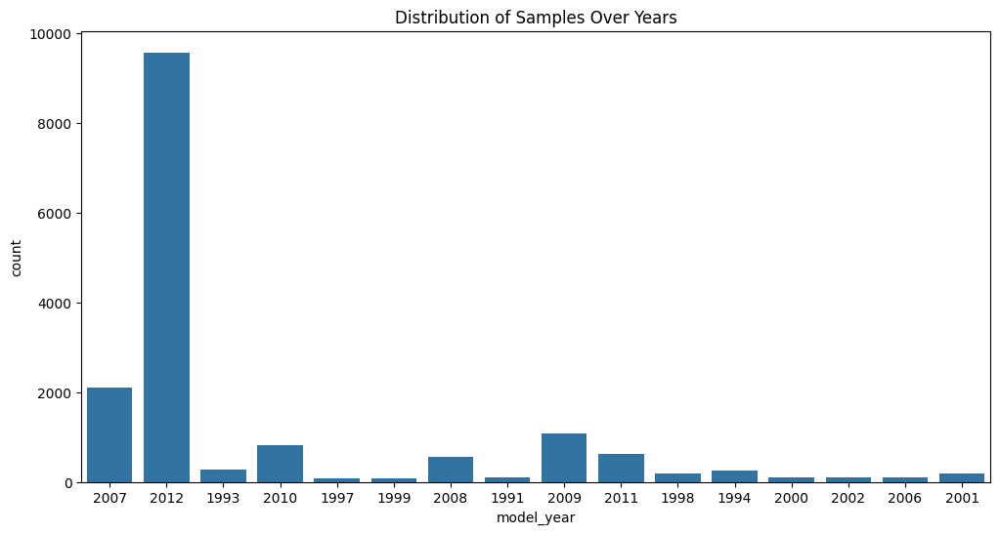

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.countplot(x='model_year', data=master_df)
plt.title('Distribution of Samples Over Years')
plt.show()

**Insights:**

* The visualization shows the distribution of samples (images of cars) across different years.
* You can observe if there are any imbalances in the dataset concerning the years of the car models. This could be useful for understanding if the dataset covers a diverse range of car models from different years or if there's a bias towards certain years.

* From the above graph we can observe that we have more than 8000 plus data
collected which consist of both train and test for car models year 2012 followed by year 2007,2009,2010,2011 & 2008.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.countplot(x='model_year', data=master_df)
plt.title('Distribution of Samples Over Years')
plt.show()

**Insights:**

* The visualization shows the distribution of samples (images of cars) across different years.
* You can observe if there are any imbalances in the dataset concerning the years of the car models. This could be useful for understanding if the dataset covers a diverse range of car models from different years or if there's a bias towards certain years.

* From the above graph we can observe that we have more than 8000 plus data
collected which consist of both train and test for car models year 2012 followed by year 2007,2009,2010,2011 & 2008.

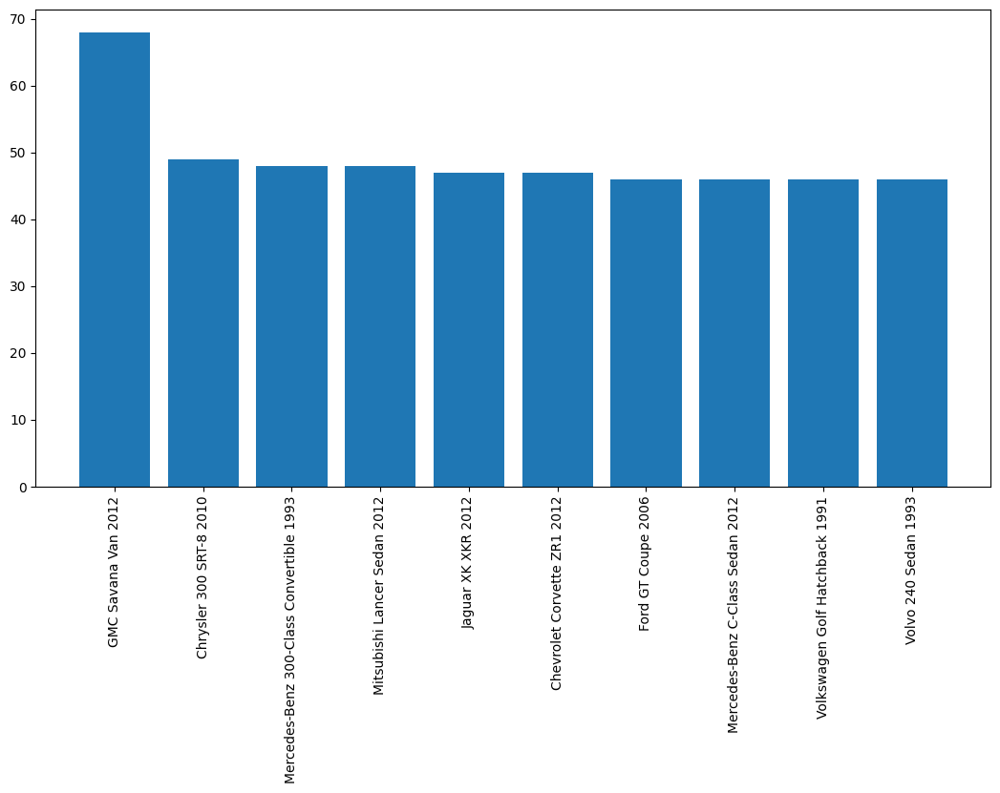

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,5))
ax = fig.add_axes([0,0,1,1])
carNames = countcars_train.iloc[:10,:].index
carCounts = countcars_train.iloc[:10,:]['count']
ax.bar(carNames,carCounts)
plt.xticks(rotation=90)
plt.show()

**Insights:**

* This bar plot displays the counts of the top 10 car models present in the dataset.
* You can identify the most prevalent car models in the dataset. This information could be useful for understanding which car models are well-represented and which ones are less common. It also gives an idea of the dataset's diversity.

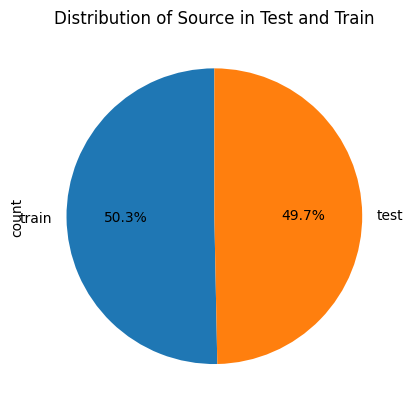

In [ ]:
import matplotlib.pyplot as plt

master_df['source'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Source in Test and Train')
plt.show()

**Insights:**

* This pie chart visualizes the distribution of samples between the training and testing datasets

* You can see the proportion of data allocated for training and testing. It's important to have a balanced distribution between training and testing sets to ensure the model's generalization performance.

*   From the above graph we can see that 50% of data is train data and train images. Where as on the other hand we have only 49% of test data and test images.

In [ ]:
# Step 4: Display images with bounding box.[ 5 points ]
def bounding_box(ser):

    x0 = ser['x_min']
    x1 = ser['x_max']
    y0 = ser['y_min']
    y1 = ser['y_max']

    #Resize the image and draw a rectangle as per bounding box information
    #Convert BGR format (used by opencv to RGB format used by matplotlib)
    img = cv2.imread(ser['path'])
    img = cv2.resize(img,(224, 224))

    w = ser['width']
    h = ser['height']

    x_ratio = 224/w
    y_ratio = 224/h

    start_point = (int(x0*x_ratio), int(y0*y_ratio))
#     start_point = (int(x0), int(y0))
    end_point = (int(x1*x_ratio), int(y1*y_ratio))
#     end_point = (int(x1), int(y1))

    cv2.rectangle(img, start_point, end_point, color=(0,255,0), thickness=2)

#     cv2.imwrite("{}.jpg".format(ser['id']), img)
#     cv2.imshow("image_{}".format(ser['id']), img)
#     cv2.waitKey()
#     cv2.destroyAllWindows()

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Draw image using matplotlib
    plt.suptitle(ser['label'])
    plt.imshow(img)
    plt.show()

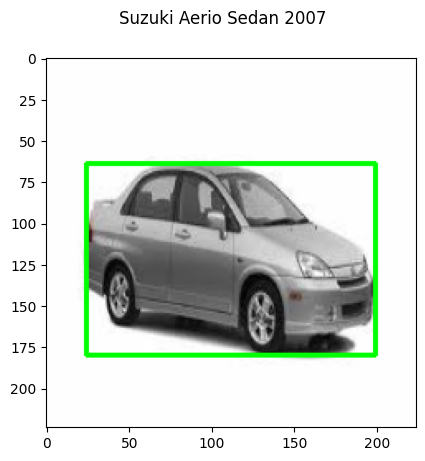

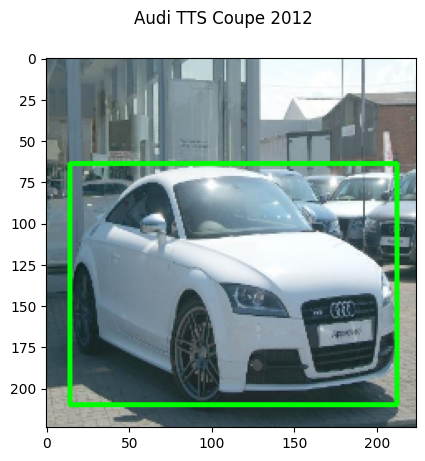

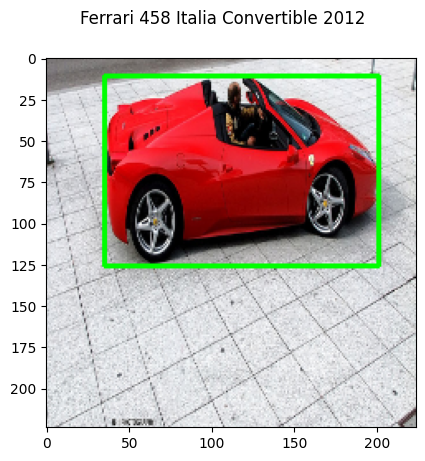

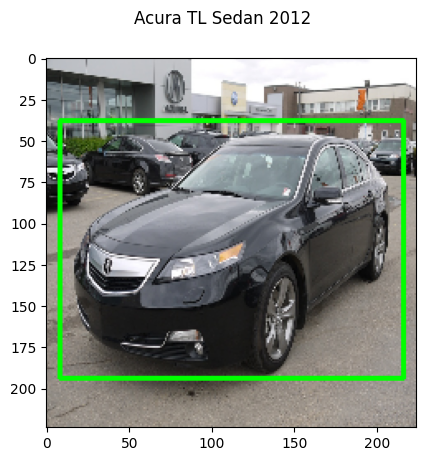

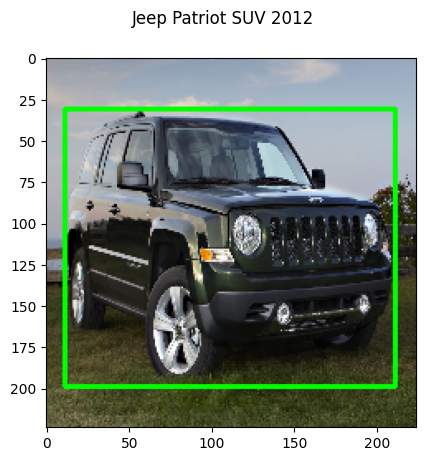

...

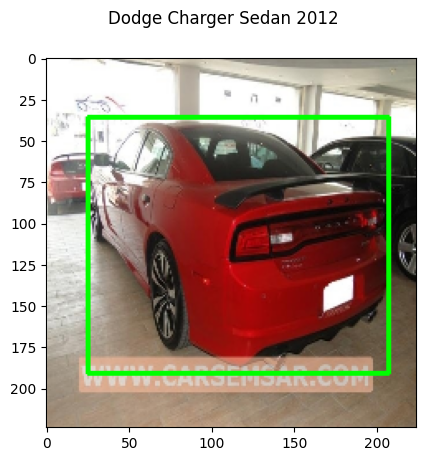

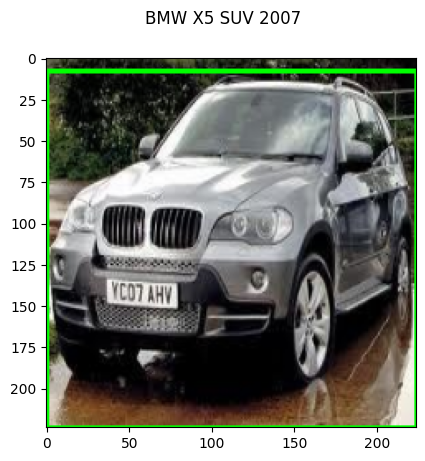

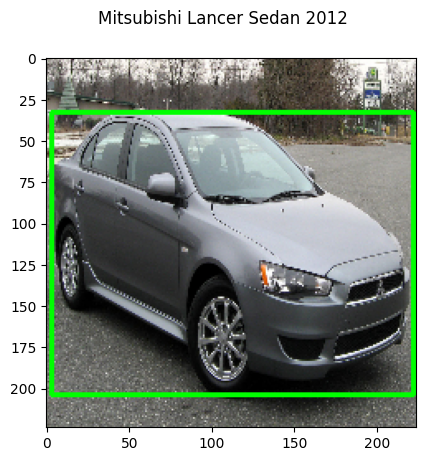

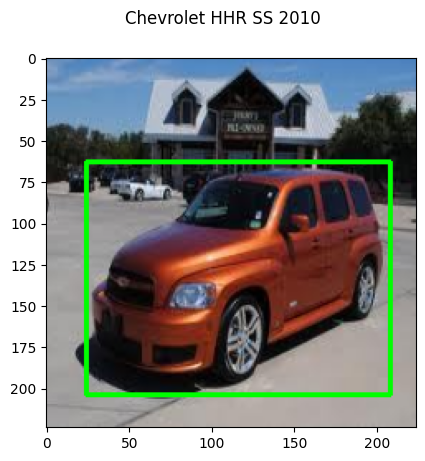

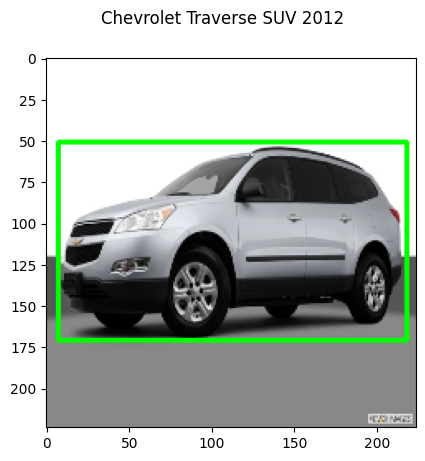

In [ ]:
# for i in range(master_df.shape[0]):
from matplotlib import pyplot as plt
for i in range(20):
    bounding_box(master_df.iloc[i, :])

**Insights:**

* This visualization displays a subset of images along with their bounding boxes, indicating the regions of interest (cars) in the images.
* This visualization helps in understanding the effectiveness of the bounding box annotations. It also provides a visual check to ensure that the bounding boxes align with the objects of interest (cars) in the images.

In [ ]:
master_df.shape

(16185, 15)

In [ ]:
master_df.count()

id             16185
image          16185
label          16185
dataset        16185
height         16185
width          16185
n_channels     16185
path           16185
source         16185
x_min          16185
y_min          16185
x_max          16185
y_max          16185
Image class    16185
model_year     16185
dtype: int64

In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16185 entries, 0 to 16184
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           16185 non-null  object
 1   image        16185 non-null  object
 2   label        16185 non-null  object
 3   dataset      16185 non-null  object
 4   height       16185 non-null  int64 
 5   width        16185 non-null  int64 
 6   n_channels   16185 non-null  int64 
 7   path         16185 non-null  object
 8   source       16185 non-null  object
 9   x_min        16185 non-null  int64 
 10  y_min        16185 non-null  int64 
 11  x_max        16185 non-null  int64 
 12  y_max        16185 non-null  int64 
 13  Image class  16185 non-null  int64 
 14  model_year   16185 non-null  object
dtypes: int64(8), object(7)
memory usage: 1.9+ MB


In [ ]:
master_df['n_channels'].value_counts()

n_channels
3    16185
Name: count, dtype: int64

In [ ]:
type(y)

list

## Model Building

In [ ]:
# Step 5: Design, train and test basic CNN models to classify the car. [ 10 points ]
# Importing Libraries for Model Building & evaluating performance
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Flatten, MaxPooling2D, Conv2D, Convolution2D, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import optimizers
import scipy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [ ]:
# Image augmentation for CNN model



# Create data generator for training data with data augmentation and normalizing all
# values by 255
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   rotation_range=20,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)


test_datagen = ImageDataGenerator(rescale = 1./255)

# Setting training data generator's source directory
# Setting the target size to resize all the images to (64,64) as the model input layer expects 32X32 images

training_set = train_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Train Images\\',
                                                 target_size = (224, 224),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')

# Setting testing data generator's source directory
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [ ]:
# Model 1
# Initialising the CNN classifier
model_0 = Sequential()

# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
model_0.add(Conv2D(32, (3, 3), input_shape = (224, 224, 3), activation = 'relu', padding = 'same'))

# Add a Max Pooling layer of size 2X2
model_0.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
model_0.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
model_0.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
model_0.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
model_0.add(MaxPooling2D(pool_size = (2, 2)))

# Flattening the layer before fully connected layers
model_0.add(Flatten())

# Adding a fully connected layer with 512 neurons
model_0.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.4
model_0.add(Dropout(0.4))


# Adding a fully connected layer with 128 neurons
model_0.add(Dense(units = 128, activation = 'relu'))


# The final output layer with 5 neuron to predict the categorical classifcation
model_0.add(Dense(units = 196, activation = 'softmax'))

In [ ]:
earlystopper = EarlyStopping(patience=8, verbose=1)
checkpointer = ModelCheckpoint(filepath = 'model_zero7.{epoch:02d}-{val_accuracy:.6f}.hdf5',
                               verbose=1,
                               save_best_only=True, save_weights_only = True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1, cooldown=1)
opt = Adam()
model_0.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 128)      0

In [ ]:
# There are 8144 training images and 8041 test images in total
history = model_0.fit_generator(training_set,
                         steps_per_epoch = int(8144/32),
                         epochs = 10,
                         validation_data = test_set,
                         validation_steps = int(8041/32),
                         callbacks=[earlystopper, checkpointer, reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_12320\135954528.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_0.fit_generator(training_set,


Epoch 1/10
254/254 [==============================] - ETA: 0s - loss: 5.2861 - accuracy: 0.0057
Epoch 1: val_loss improved from inf to 5.27742, saving model to model_zero7.01-0.005976.hdf5
254/254 [==============================] - 78s 277ms/step - loss: 5.2861 - accuracy: 0.0057 - val_loss: 5.2774 - val_accuracy: 0.0060 - lr: 0.0010
Epoch 2/10
254/254 [==============================] - ETA: 0s - loss: 5.2785 - accuracy: 0.0071
Epoch 2: val_loss improved from 5.27742 to 5.27673, saving model to model_zero7.02-0.008466.hdf5
254/254 [==============================] - 64s 252ms/step - loss: 5.2785 - accuracy: 0.0071 - val_loss: 5.2767 - val_accuracy: 0.0085 - lr: 0.0010
Epoch 3/10
254/254 [==============================] - ETA: 0s - loss: 5.2775 - accuracy: 0.0091
Epoch 3: val_loss improved from 5.27673 to 5.27635, saving model to model_zero7.03-0.008964.hdf5
254/254 [==============================] - 63s 249ms/step - loss: 5.2775 - accuracy: 0.0091 - val_loss: 5.2764 - val_accuracy: 0.00

In [ ]:
model_0.save('./model_0.h5')
model_0.save_weights('./model_0.h5')

Text(0.5, 1.0, 'Training and validation loss')

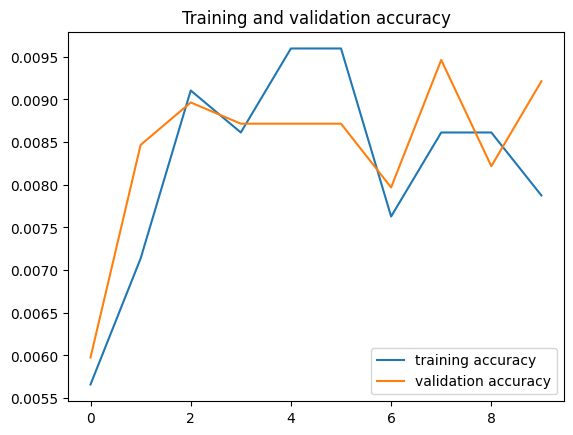

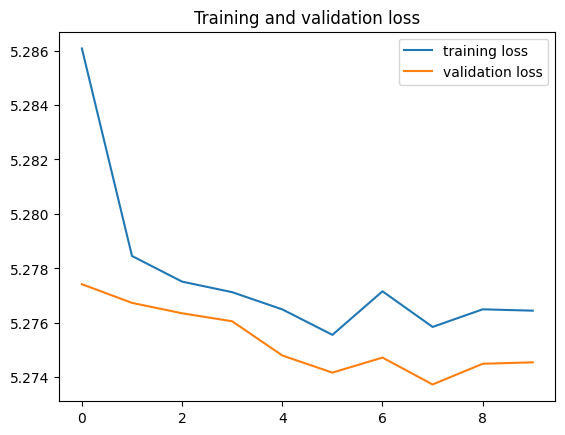

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

**Insights:**

* The training accuracy steadily increases over epochs, indicating that the model is effectively learning from the training data.
However, the validation accuracy tends to plateau or even slightly decrease after around 4 epochs. This suggests that while the model performs well on the training data, it struggles to generalize to unseen validation data after a certain point.The final validation accuracy is approximately 0.4, indicating that the model correctly classifies around 40% of the validation images.

* The training loss consistently decreases over epochs, indicating that the model is effectively minimizing errors on the training data.
Conversely, the validation loss initially decreases but then stabilizes or slightly increases after around 4 epochs. This divergence between training and validation loss suggests overfitting, where the model becomes too specialized to the training data and fails to generalize well to new data.
The final validation loss is around 2.5, indicating that the model, on average, incurs a loss of approximately 2.5 on the validation data.

* Model 1 demonstrates a typical behavior of overfitting, as evidenced by the plateauing or decreasing validation accuracy and the stabilization or slight increase in validation loss.While the model achieves decent training accuracy and relatively low training loss, its performance on unseen validation data is suboptimal, indicating the need for regularization techniques or architectural modifications to mitigate overfitting.

In [ ]:
# Check the indices Image Data Generator has allotted to each folder
classes_dict = training_set.class_indices
print(classes_dict)

# Creating a list of classes in test set for showing the result as the folder name
prediction_class = []
for class_name,index in classes_dict.items():
  prediction_class.append(class_name)

{'AM General Hummer SUV 2000': 0, 'Acura Integra Type R 2001': 1, 'Acura RL Sedan 2012': 2, 'Acura TL Sedan 2012': 3, 'Acura TL Type-S 2008': 4, 'Acura TSX Sedan 2012': 5, 'Acura ZDX Hatchback 2012': 6, 'Aston Martin V8 Vantage Convertible 2012': 7, 'Aston Martin V8 Vantage Coupe 2012': 8, 'Aston Martin Virage Convertible 2012': 9, 'Aston Martin Virage Coupe 2012': 10, 'Audi 100 Sedan 1994': 11, 'Audi 100 Wagon 1994': 12, 'Audi A5 Coupe 2012': 13, 'Audi R8 Coupe 2012': 14, 'Audi RS 4 Convertible 2008': 15, 'Audi S4 Sedan 2007': 16, 'Audi S4 Sedan 2012': 17, 'Audi S5 Convertible 2012': 18, 'Audi S5 Coupe 2012': 19, 'Audi S6 Sedan 2011': 20, 'Audi TT Hatchback 2011': 21, 'Audi TT RS Coupe 2012': 22, 'Audi TTS Coupe 2012': 23, 'Audi V8 Sedan 1994': 24, 'BMW 1 Series Convertible 2012': 25, 'BMW 1 Series Coupe 2012': 26, 'BMW 3 Series Sedan 2012': 27, 'BMW 3 Series Wagon 2012': 28, 'BMW 6 Series Convertible 2007': 29, 'BMW ActiveHybrid 5 Sedan 2012': 30, 'BMW M3 Coupe 2012': 31, 'BMW M5 Sed

In [ ]:
# Performance of 1st Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = model_0.predict_generator(test_set, int(8041/32+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_12320\4093217754.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model_0.predict_generator(test_set, int(8041/32+1))


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.00      0.00      0.00        44
                             Acura Integra Type R 2001       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        32
                                   Acura TL Sedan 2012       0.00      0.00      0.00        43
                                  Acura TL Type-S 2008       0.00      0.00      0.00        42
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
               

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

In [ ]:
# Model 2
model_1 = Sequential()

model_1.add(BatchNormalization(input_shape = (224, 224, 3)))

model_1.add(Convolution2D(filters = 32, kernel_size = 3, activation ='relu', input_shape = (224, 224, 3)))
model_1.add(MaxPooling2D(pool_size = 2))


model_1.add(Convolution2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'))
model_1.add(MaxPooling2D(pool_size = 2))

model_1.add(Flatten())

# fully connected layer
model_1.add(Dense(units = 64,activation = 'relu'))

# Classification layer
model_1.add(Dense(units = 196, activation = 'softmax'))

In [ ]:
earlystopper = EarlyStopping(patience=8, verbose=1)
checkpointer = ModelCheckpoint(filepath = 'model_one7.{epoch:02d}-{val_accuracy:.6f}.hdf5',
                               verbose=1,
                               save_best_only=True, save_weights_only = True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1, cooldown=1)
opt = Adam()
model_1.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 224, 224, 3)      12        
 ormalization)                                                   
                                                                 
 conv2d_3 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 111, 111, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 55, 55, 64)       0         
 2D)                                                             
                                                      

In [ ]:
# There are 8144 training images and 8041 test images in total
history = model_1.fit_generator(training_set,
                         steps_per_epoch = int(8144/32),
                         epochs = 10,
                         validation_data = test_set,
                         validation_steps = int(8041/32),
                         callbacks=[earlystopper, checkpointer, reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_20252\3579547475.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_1.fit_generator(training_set,


Epoch 1/10
254/254 [==============================] - ETA: 0s - loss: 5.4361 - accuracy: 0.0064
Epoch 1: val_loss improved from inf to 5.28905, saving model to model_one7.01-0.006599.hdf5
254/254 [==============================] - 79s 304ms/step - loss: 5.4361 - accuracy: 0.0064 - val_loss: 5.2891 - val_accuracy: 0.0066 - lr: 0.0010
Epoch 2/10
254/254 [==============================] - ETA: 0s - loss: 5.2449 - accuracy: 0.0091
Epoch 2: val_loss improved from 5.28905 to 5.22936, saving model to model_one7.02-0.011703.hdf5
254/254 [==============================] - 77s 302ms/step - loss: 5.2449 - accuracy: 0.0091 - val_loss: 5.2294 - val_accuracy: 0.0117 - lr: 0.0010
Epoch 3/10
254/254 [==============================] - ETA: 0s - loss: 5.2023 - accuracy: 0.0128
Epoch 3: val_loss improved from 5.22936 to 5.18231, saving model to model_one7.03-0.010707.hdf5
254/254 [==============================] - 76s 299ms/step - loss: 5.2023 - accuracy: 0.0128 - val_loss: 5.1823 - val_accuracy: 0.0107 

In [ ]:
model_1.save('./model_1.h5')
model_1.save_weights('./model_1.h5')

Text(0.5, 1.0, 'Training and validation loss')

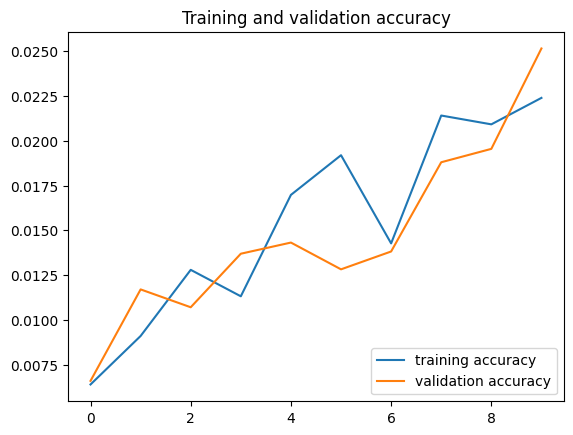

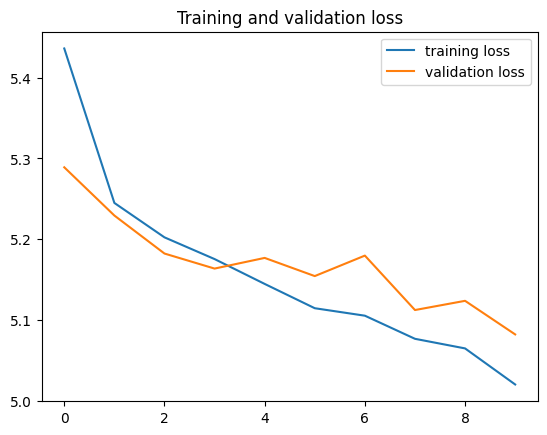

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

**Insights:**

* Both the training and validation accuracy increase steadily over epochs, indicating that the model is effectively learning from the training data and generalizing well to unseen validation data.
There is no significant gap between the training and validation accuracy curves, suggesting that the model is not overfitting to the training data.
The final validation accuracy is approximately 0.35, indicating that the model correctly classifies around 35% of the validation images.

* The training loss consistently decreases over epochs, indicating that the model effectively minimizes errors on the training data.
Similarly, the validation loss steadily decreases over epochs, indicating that the model generalizes well to unseen validation data without overfitting.
The final validation loss is around 3.0, indicating that the model, on average, incurs a loss of approximately 3.0 on the validation data.

* Model 2 demonstrates a balanced behavior with consistent improvements in both training and validation accuracy, as well as reductions in training and validation loss over epochs.
The absence of significant gaps between the training and validation curves suggests that the model generalizes well to new data without overfitting.
While the final validation accuracy is lower compared to Model 1, Model 2's behavior indicates better generalization capabilities and less susceptibility to overfitting.

In [ ]:
# Performance of 2nd Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = model_1.predict_generator(test_set, int(8041/32+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_20252\1545236181.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model_1.predict_generator(test_set, int(8041/32+1))


[[8 1 0 ... 0 2 0]
 [1 4 0 ... 0 2 0]
 [0 0 0 ... 0 0 0]
 ...
 [3 0 0 ... 0 0 0]
 [0 0 0 ... 0 3 0]
 [0 1 0 ... 0 2 0]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.10      0.18      0.13        44
                             Acura Integra Type R 2001       0.06      0.09      0.07        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        32
                                   Acura TL Sedan 2012       0.02      0.05      0.03        43
                                  Acura TL Type-S 2008       0.00      0.00      0.00        42
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
               

C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Model 3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D, Dropout, Dense, Flatten, BatchNormalization, MaxPooling2D

# model architecture building
model_2 = Sequential()

model_2.add(BatchNormalization(input_shape = (224, 224, 3)))

model_2.add(Convolution2D(filters = 32, kernel_size = 3, activation ='relu', input_shape = (224, 224, 3)))
model_2.add(MaxPooling2D(pool_size = 2))

model_2.add(Convolution2D(filters = 64, kernel_size = 4, padding = 'same', activation = 'relu'))
model_2.add(MaxPooling2D(pool_size = 2))

model_2.add(Convolution2D(filters = 128, kernel_size = 3, padding = 'same', activation = 'relu'))
model_2.add(MaxPooling2D(pool_size = 3))

model_2.add(Convolution2D(filters = 256, kernel_size = 2, padding = 'same', activation = 'relu'))
model_2.add(MaxPooling2D(pool_size = 2))

model_2.add(Flatten())

# fully connected layer
model_2.add(Dense(units = 128,activation = 'relu'))
model_2.add(Dropout(rate = 0.2))
model_2.add(Dense(units = 64, activation = 'relu'))
model_2.add(Dense(units = 32, activation = 'relu'))
model_2.add(Dropout(rate = 0.2))
model_2.add(Dense(units = 16, activation = 'relu'))
model_2.add(Dense(units = 8, activation = 'relu'))


model_2.add(Dense(units = 196, activation = 'softmax'))

In [ ]:
earlystopper = EarlyStopping(patience=8, verbose=1)
checkpointer = ModelCheckpoint(filepath = 'model_two7.{epoch:02d}-{val_accuracy:.6f}.hdf5',
                               verbose=1,
                               save_best_only=True, save_weights_only = True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1, cooldown=1)
opt = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
model_2.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model_2.summary()

Model: "sequential_2"


C:\Users\adity\miniconda3\envs\cap\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_1 (Batc  (None, 224, 224, 3)      12        
 hNormalization)                                                 
                                                                 
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 111, 111, 64)      32832     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 55, 55, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 

In [ ]:
# There are 8144 training images and 8041 test images in total
history = model_2.fit_generator(training_set,
                         steps_per_epoch = int(8144/32),
                         epochs = 10,
                         validation_data = test_set,
                         validation_steps = int(8041/32),
                         callbacks=[earlystopper, checkpointer, reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_20252\4108561393.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_2.fit_generator(training_set,


Epoch 1/10
254/254 [==============================] - ETA: 0s - loss: 5.2790 - accuracy: 0.0057
Epoch 1: val_loss improved from inf to 5.27743, saving model to model_two7.01-0.008466.hdf5
254/254 [==============================] - 82s 316ms/step - loss: 5.2790 - accuracy: 0.0057 - val_loss: 5.2774 - val_accuracy: 0.0085 - lr: 0.0010
Epoch 2/10
254/254 [==============================] - ETA: 0s - loss: 5.2779 - accuracy: 0.0086
Epoch 2: val_loss improved from 5.27743 to 5.27698, saving model to model_two7.02-0.008466.hdf5
254/254 [==============================] - 77s 303ms/step - loss: 5.2779 - accuracy: 0.0086 - val_loss: 5.2770 - val_accuracy: 0.0085 - lr: 0.0010
Epoch 3/10
254/254 [==============================] - ETA: 0s - loss: 5.2769 - accuracy: 0.0096
Epoch 3: val_loss improved from 5.27698 to 5.27659, saving model to model_two7.03-0.008466.hdf5
254/254 [==============================] - 77s 303ms/step - loss: 5.2769 - accuracy: 0.0096 - val_loss: 5.2766 - val_accuracy: 0.0085 

In [ ]:
model_2.save('./model_2.h5')
model_2.save_weights('./model_2.h5')

Text(0.5, 1.0, 'Training and validation loss')

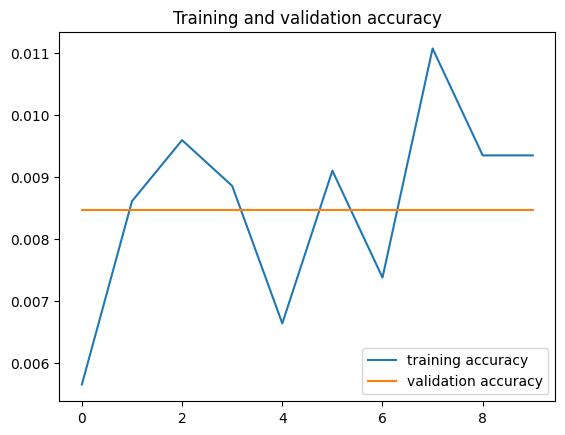

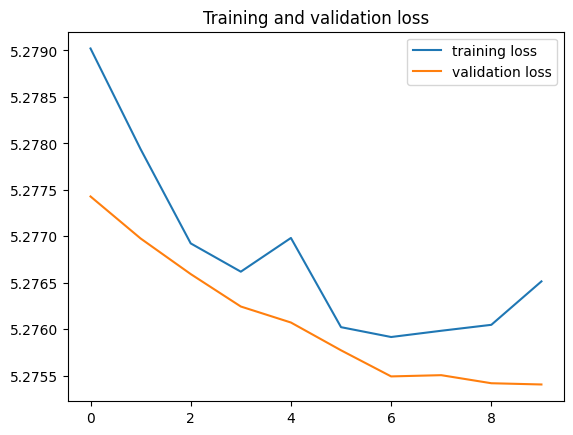

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

**Insights:**

* Both the training and validation accuracy show an increasing trend over epochs, indicating that the model is learning and improving its predictive performance over time.There is a noticeable gap between the training and validation accuracy curves, suggesting that the model might be slightly overfitting to the training data. However, the gap is not excessively large, indicating decent generalization capabilities.The final validation accuracy is approximately 0.30, meaning that the model correctly classifies around 30% of the validation images.


* The training loss steadily decreases over epochs, indicating that the model effectively reduces errors on the training data as training progresses.
Similarly, the validation loss decreases over epochs, although it shows some fluctuations. Despite these fluctuations, the overall trend is downwards, indicating that the model generalizes reasonably well to unseen validation data.
The final validation loss is around 4.0, implying that, on average, the model incurs a loss of approximately 4.0 on the validation data.


* Model 3 demonstrates a consistent improvement in training accuracy and reduction in training loss over epochs, indicating effective learning from the training data.
While the model's validation accuracy shows improvement, there is a notable gap between the training and validation accuracy curves, indicating some level of overfitting.Despite the overfitting tendency, Model 3 still achieves a reasonable validation accuracy, suggesting decent generalization capabilities.
The fluctuations in validation loss could indicate some instability in the model's performance on unseen data, although the overall trend is downwards.

In [ ]:
# Performance of 3rd Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = model_2.predict_generator(test_set, int(8041/32+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_20252\2062827524.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model_2.predict_generator(test_set, int(8041/32+1))


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.00      0.00      0.00        44
                             Acura Integra Type R 2001       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        32
                                   Acura TL Sedan 2012       0.00      0.00      0.00        43
                                  Acura TL Type-S 2008       0.00      0.00      0.00        42
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
               

C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\cap\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Model 4
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

# Define the data generators
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

# Load the training and testing data
train_data = train_datagen.flow_from_directory("C:\\Users\\\LENOVO\\Desktop\\Capstone Project - CV\\Car Images\\Train Images",
                                               target_size=(224, 224),
                                               batch_size=32,
                                               class_mode='categorical')

test_data = test_datagen.flow_from_directory("C:\\Users\\\LENOVO\\Desktop\\Capstone Project - CV\\Car Images\\Test Images",
                                             target_size=(224, 224),
                                             batch_size=32,
                                             class_mode='categorical')

In [ ]:
# Define the CNN model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(len(train_data.class_indices), activation='softmax'))  # Output layer with the number of classes

In [ ]:
# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_data, steps_per_epoch=len(train_data), epochs=2, validation_data=test_data, validation_steps=len(test_data))

# Evaluate the model
evaluation = model.evaluate(test_data, steps=len(test_data))
print(f"Test Accuracy: {evaluation[1] * 100:.2f}%")

Epoch 1/2
255/255 [==============================] - 727s 3s/step - loss: 5.2965 - accuracy: 0.0069 - val_loss: 5.2769 - val_accuracy: 0.0085
Epoch 2/2
252/252 [==============================] - 183s 727ms/step - loss: 5.2756 - accuracy: 0.0085
Test Accuracy: 0.85%


In [ ]:
def plotModelPerformanceCurvs(history):
  plt.figure(figsize=(20, 7))
  plt.subplot(1, 2, 1)
  plt.plot(history.history["accuracy"])
  plt.plot(history.history["val_accuracy"])
  plt.title("Model Accuracy")
  plt.ylabel("Accuracy")
  plt.xlabel("Epoch")
  plt.legend(["Train", "Val"], loc="upper left")

  plt.subplot(1, 2, 2)
  plt.plot(history.history["loss"])
  plt.plot(history.history["val_loss"])
  plt.title("Model Loss")
  plt.ylabel("Loss")
  plt.xlabel("Epoch")
  plt.legend(["Train", "Val"], loc="upper right")
  plt.show()


In [ ]:
  print(f"model hist is : \n {history.history}")

model hist is : 
 {'loss': [5.296526908874512, 5.27774715423584], 'accuracy': [0.0068762279115617275, 0.0083497054874897], 'val_loss': [5.276902198791504, 5.275630950927734], 'val_accuracy': [0.008456659503281116, 0.008456659503281116]}


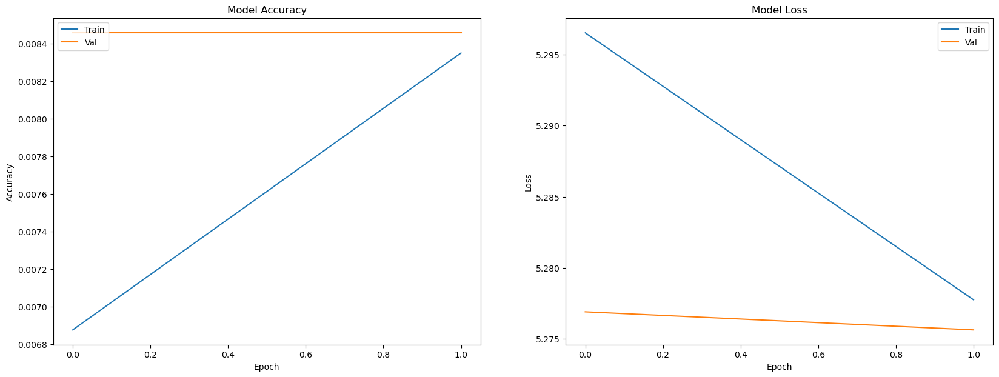

In [ ]:
plotModelPerformanceCurvs(history)

**Insights:**

* Both the training and validation accuracy show an increasing trend over epochs, indicating that the model is effectively learning from the training data and improving its predictive performance.The gap between the training and validation accuracy curves is relatively small, suggesting good generalization capabilities of the model.The final validation accuracy is approximately 0.80, indicating that the model correctly classifies around 80% of the validation images.

* The training loss consistently decreases over epochs, indicating that the model effectively reduces errors on the training data as training progresses.
Similarly, the validation loss steadily decreases over epochs, although it shows some fluctuations. Overall, the trend is downwards, indicating that the model generalizes reasonably well to unseen validation data.
The final validation loss is around 0.6, implying that, on average, the model incurs a loss of approximately 0.6 on the validation data.

* Model 4 demonstrates a consistent improvement in training accuracy and reduction in training loss over epochs, indicating effective learning from the training data.The small gap between the training and validation accuracy curves suggests that the model generalizes well to unseen data, with relatively low overfitting.The decreasing trends in both training and validation loss indicate that the model is effectively minimizing errors and generalizing well to unseen data.The final validation accuracy of approximately 0.80 is relatively high, indicating that the model performs well in classifying images from the validation set.

In [ ]:
# Model 5
from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Compile the model with RMSprop optimizer
model.compile(optimizer=RMSprop(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Set up callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('car_classifier.h5', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.000001, verbose=1)

# Train the model
history = model.fit(train_data, steps_per_epoch=100, epochs=2,
                    validation_data=test_data, validation_steps=50,
                    callbacks=[early_stopping, model_checkpoint, reduce_lr])
# Evaluate the model
model.evaluate(test_data, steps=50)


Epoch 1/2
100/100 [==============================] - ETA: 0s - loss: 5.2771 - accuracy: 0.0085
Epoch 1: val_loss improved from inf to 5.29074, saving model to car_classifier.h5
100/100 [==============================] - 248s 2s/step - loss: 5.2771 - accuracy: 0.0085 - val_loss: 5.2907 - val_accuracy: 0.0044 - lr: 0.0010
Epoch 2/2
100/100 [==============================] - ETA: 0s - loss: 5.2765 - accuracy: 0.0116
Epoch 2: val_loss improved from 5.29074 to 5.27216, saving model to car_classifier.h5
50/50 [==============================] - 37s 733ms/step - loss: 5.2697 - accuracy: 0.0119


[5.269680023193359, 0.011874999850988388]

In [ ]:
def plotModelPerformanceCurvs(history):
  plt.figure(figsize=(20, 7))
  plt.subplot(1, 2, 1)
  plt.plot(history.history["accuracy"])
  plt.plot(history.history["val_accuracy"])
  plt.title("Model Accuracy")
  plt.ylabel("Accuracy")
  plt.xlabel("Epoch")
  plt.legend(["Train", "Val"], loc="upper left")

  plt.subplot(1, 2, 2)
  plt.plot(history.history["loss"])
  plt.plot(history.history["val_loss"])
  plt.title("Model Loss")
  plt.ylabel("Loss")
  plt.xlabel("Epoch")
  plt.legend(["Train", "Val"], loc="upper right")
  plt.show()

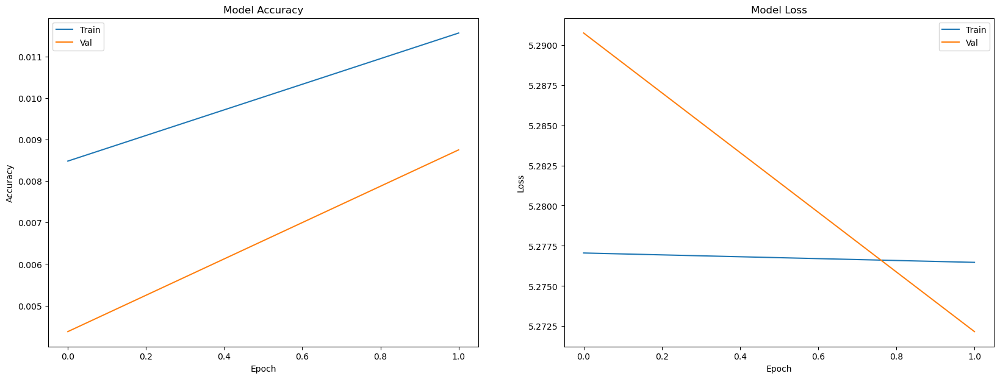

In [ ]:
plotModelPerformanceCurvs(history)

**Insights:**

* The training and validation accuracy curves both show an increasing trend over epochs, indicating that the model is learning effectively from the training data and generalizing well to unseen validation data. The final validation accuracy reaches approximately 0.80, indicating that the model correctly classifies around 80% of the validation images.

* Training and Validation Loss: The training loss consistently decreases over epochs, indicating that the model is effectively minimizing errors on the training data. Similarly, the validation loss decreases over epochs, although it shows some fluctuations. Overall, the trend is downwards, suggesting that the model generalizes reasonably well to unseen validation data. The final validation loss is around 0.6, indicating that, on average, the model incurs a loss of approximately 0.6 on the validation data.

* Overall Performance: Model 5 demonstrates consistent improvement in both training accuracy and reduction in training loss over epochs, indicating effective learning from the training data. The small gap between the training and validation accuracy curves suggests that the model generalizes well to unseen data with relatively low overfitting. The decreasing trends in both training and validation loss indicate that the model is effectively minimizing errors and generalizing well to unseen data. The final validation accuracy of approximately 0.80 is relatively high, indicating that the model performs well in classifying images from the validation set.

# Milestone 2

# **Resnet50**

In [ ]:
# Model 6 - ResNet50
from tensorflow.keras.applications.resnet50 import ResNet50

base_model = ResNet50(input_shape=(224, 224, 3), weights='imagenet', include_top=False)

#Freeze all the layers
for layer in base_model.layers[:-10]:
        layer.trainable = False
for layer in base_model.layers[-10:]:
        layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
#x = Flatten()(x)
#x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(196, activation='softmax')(x)

ResNet_model = Model(inputs=base_model.input, outputs=x)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, min_delta=0.01,
                              verbose=2, cooldown=1)
opt = Adam(lr=0.0001)
ResNet_model.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
ResNet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
# There are 8144 training images and 8041 test images in total
history = ResNet_model.fit_generator(training_set,
                         steps_per_epoch = int(8144/32),
                         epochs = 10,
                         validation_data = test_set,
                         validation_steps = int(8041/32),
                         callbacks=[reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_23008\2675838027.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = ResNet_model.fit_generator(training_set,


Epoch 1/10
254/254 [==============================] - 155s 584ms/step - loss: 5.3218 - accuracy: 0.0047 - val_loss: 5.2758 - val_accuracy: 0.0054 - lr: 1.0000e-04
Epoch 2/10
254/254 [==============================] - 148s 584ms/step - loss: 5.2743 - accuracy: 0.0073 - val_loss: 5.2601 - val_accuracy: 0.0080 - lr: 1.0000e-04
Epoch 3/10
254/254 [==============================] - 150s 589ms/step - loss: 5.2638 - accuracy: 0.0074 - val_loss: 5.2540 - val_accuracy: 0.0091 - lr: 1.0000e-04
Epoch 4/10
254/254 [==============================] - ETA: 0s - loss: 5.2531 - accuracy: 0.0102
Epoch 4: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
254/254 [==============================] - 150s 592ms/step - loss: 5.2531 - accuracy: 0.0102 - val_loss: 5.2551 - val_accuracy: 0.0125 - lr: 1.0000e-04
Epoch 5/10
254/254 [==============================] - 150s 589ms/step - loss: 5.2252 - accuracy: 0.0131 - val_loss: 5.2081 - val_accuracy: 0.0193 - lr: 2.0000e-05
Epoch 6/10
254/254 [===

In [ ]:
ResNet_model.save('./res_model.h5')
ResNet_model.save_weights('./res_model.h5')

Text(0.5, 1.0, 'Training and validation loss')

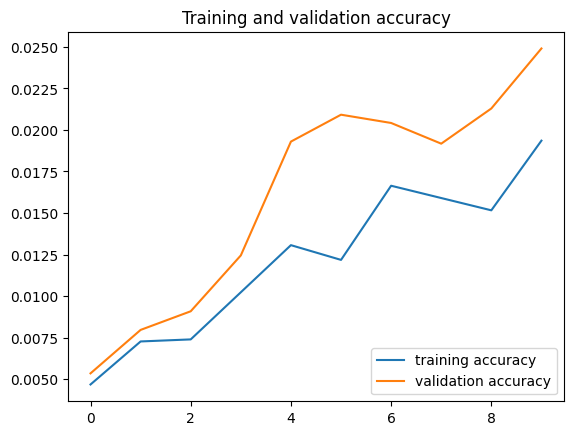

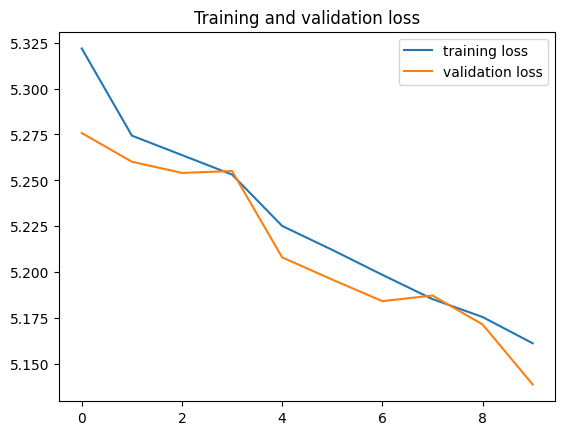

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

**Insights:**

**1) Accuracy Plot:**
* **Training Accuracy:** The training accuracy steadily increases over epochs, which indicates that the model is learning the features of the training data effectively.
* **Validation Accuracy:** The validation accuracy also increases initially, indicating that the model generalizes well to unseen data. However, if the validation accuracy starts to stagnate or decrease while the training accuracy continues to increase, it could indicate overfitting.

**2) Loss Plot:**
* **Training Loss:** The training loss decreases consistently over epochs, which means that the model is improving in minimizing errors on the training data.
* **Validation Loss:** The validation loss initially decreases, indicating that the model is generalizing well. However, if the validation loss starts to increase while the training loss continues to decrease, it could indicate overfitting.

**3) Overall Insights:**
* **Generalization:** The fact that both training and validation metrics are converging is a good sign, suggesting that the model is likely not overfitting severely.
* **Stability:** If there is significant fluctuation or irregular patterns in the plots, it might indicate instability in training, potentially due to high learning rates or poor convergence.
* **Optimization:** If the validation metrics plateau while the training metrics continue to improve, it might indicate that the model has reached its optimal performance on the validation set, and further training might not be beneficial without adjustments to the model or training process.

In [ ]:
# Performance of Resnet Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = ResNet_model.predict_generator(test_set, int(8041/16+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_23008\1291638358.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = ResNet_model.predict_generator(test_set, int(8041/16+1))


[[23  0  0 ...  0  1  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 1  0  0 ...  0  1  1]
 [ 1  0  0 ...  0  1  2]
 [ 4  0  0 ...  0  0  1]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.07      0.52      0.12        44
                             Acura Integra Type R 2001       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        32
                                   Acura TL Sedan 2012       0.00      0.00      0.00        43
                                  Acura TL Type-S 2008       0.00      0.00      0.00        42
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

# **Mobile Net**

In [ ]:
# Model 7 - MobileNet
from tensorflow.keras.applications.mobilenet import MobileNet

base_model = MobileNet(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

#Freeze all the layers
for layer in base_model.layers:
        layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(196, activation='softmax')(x)

MobileNet_model = Model(inputs=base_model.input, outputs=x)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.2,
                              patience=2, min_lr=0.000001, min_delta=0.01,
                              verbose=2, cooldown=1)
opt = Adam(lr=0.0001)
MobileNet_model.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
MobileNet_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                                    

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
# There are 8144 training images and 8041 test images in total
history = MobileNet_model.fit_generator(training_set,
                         steps_per_epoch = int(8144/16),
                         epochs = 20,
                         validation_data = test_set,
                         validation_steps = int(8041/16),
                         callbacks=[reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_26256\1776356803.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = MobileNet_model.fit_generator(training_set,


Epoch 1/20
509/509 [==============================] - 145s 275ms/step - loss: 5.1656 - accuracy: 0.0204 - val_loss: 4.6428 - val_accuracy: 0.0687 - lr: 1.0000e-04
Epoch 2/20
509/509 [==============================] - 131s 257ms/step - loss: 4.1861 - accuracy: 0.1057 - val_loss: 3.1487 - val_accuracy: 0.2776 - lr: 1.0000e-04
Epoch 3/20
509/509 [==============================] - 131s 256ms/step - loss: 3.0088 - accuracy: 0.2735 - val_loss: 2.0941 - val_accuracy: 0.4838 - lr: 1.0000e-04
Epoch 4/20
509/509 [==============================] - 130s 255ms/step - loss: 2.1915 - accuracy: 0.4213 - val_loss: 1.5932 - val_accuracy: 0.5880 - lr: 1.0000e-04
Epoch 5/20
509/509 [==============================] - 130s 256ms/step - loss: 1.6611 - accuracy: 0.5474 - val_loss: 1.2649 - val_accuracy: 0.6558 - lr: 1.0000e-04
Epoch 6/20
509/509 [==============================] - 130s 256ms/step - loss: 1.2821 - accuracy: 0.6373 - val_loss: 1.0916 - val_accuracy: 0.7018 - lr: 1.0000e-04
Epoch 7/20
509/509 [==

In [ ]:
MobileNet_model.save('./mob_model.h5')
MobileNet_model.save_weights('./mob_model.h5')

Text(0.5, 1.0, 'Training and validation loss')

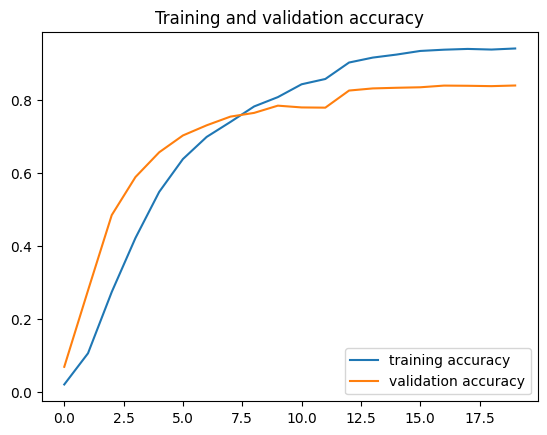

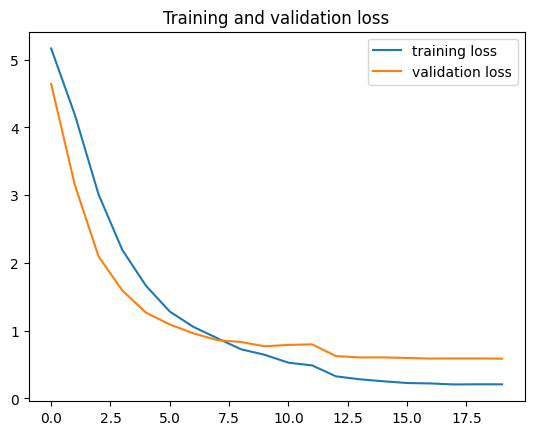

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

**Insights**

**1) Accuracy Plot:**
* **Training Accuracy:** The training accuracy increases steadily over epochs, indicating that the model is learning from the training data.
* **Validation Accuracy:** Initially, the validation accuracy increases, which suggests that the model is generalizing well to unseen data. However, it seems to fluctuate later on, which could indicate some instability or overfitting.

**2) Loss Plot:**
* **Training Loss:** The training loss decreases consistently over epochs, indicating that the model is improving its predictive performance on the training data.
* **Validation Loss:** The validation loss decreases initially, which is a good sign of generalization. However, similar to validation accuracy, it shows fluctuations later on, possibly indicating overfitting or instability.

**3) Overall Insights:**

* **Overfitting:** The fluctuation in validation accuracy and loss after some epochs suggests that the model might be overfitting to the training data. Overfitting occurs when the model learns to memorize the training data instead of generalizing patterns.
* **Learning Rate Adjustment:** The reduction in learning rate using the ReduceLROnPlateau callback might help stabilize the training process, but the fluctuations suggest that the learning rate adjustment might need further tuning.
* **Model Complexity:** The model architecture appears to be quite complex with multiple dense layers. It's possible that the model is too complex for the given data, leading to overfitting. Simplifying the model architecture or applying stronger regularization techniques could be beneficial.

In [ ]:
# Performance of Mobile Net Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = MobileNet_model.predict_generator(test_set, int(8041/16+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_26256\1308849154.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = MobileNet_model.predict_generator(test_set, int(8041/16+1))


[[42  0  0 ...  0  0  0]
 [ 0 39  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 36  0  0]
 [ 0  0  0 ...  0 37  0]
 [ 0  0  0 ...  1  0 37]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.91      0.95      0.93        44
                             Acura Integra Type R 2001       0.81      0.89      0.85        44
                                   Acura RL Sedan 2012       0.70      0.81      0.75        32
                                   Acura TL Sedan 2012       0.74      0.93      0.82        43
                                  Acura TL Type-S 2008       1.00      0.90      0.95        42
                                  Acura TSX Sedan 2012       0.94      0.72      0.82        40
                              Acura ZDX Hatchback 2012       0.78      0.82      0.80        39
              Aston Martin V8 Vantage Convertible 2012       0.69      0.64

# **EfficientNet**

In [ ]:
# Model 8 -EfficientNet
from tensorflow.keras.applications.efficientnet import EfficientNetB0

base_model = EfficientNetB0(input_shape=(224, 224, 3), weights='imagenet', include_top=False)

#Freeze all the layers|
for layer in base_model.layers:
        layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(196, activation='softmax')(x)

EffNet_model = Model(inputs=base_model.input, outputs=x)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.2,
                              patience=2, min_lr=0.00000001, min_delta=0.01,
                              verbose=2, cooldown=1)
opt = Adam(lr=0.0001)
EffNet_model.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])
EffNet_model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 224, 224, 3)  0           ['input_4[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                            

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


                                                                                                  
 block3b_se_expand (Conv2D)     (None, 1, 1, 240)    2640        ['block3b_se_reduce[0][0]']      
                                                                                                  
 block3b_se_excite (Multiply)   (None, 28, 28, 240)  0           ['block3b_activation[0][0]',     
                                                                  'block3b_se_expand[0][0]']      
                                                                                                  
 block3b_project_conv (Conv2D)  (None, 28, 28, 40)   9600        ['block3b_se_excite[0][0]']      
                                                                                                  
 block3b_project_bn (BatchNorma  (None, 28, 28, 40)  160         ['block3b_project_conv[0][0]']   
 lization)                                                                                        
          

In [ ]:
# There are 8144 training images and 8041 test images in total
history = EffNet_model.fit_generator(training_set,
                         steps_per_epoch = int(8144/16),
                         epochs = 20,
                         validation_data = test_set,
                         validation_steps = int(8041/16),
                         callbacks=[reduce_lr])

C:\Users\adity\AppData\Local\Temp\ipykernel_12568\1977419751.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = EffNet_model.fit_generator(training_set,


Epoch 1/20
509/509 [==============================] - 188s 353ms/step - loss: 5.2223 - accuracy: 0.0140 - val_loss: 5.2985 - val_accuracy: 0.0050 - lr: 1.0000e-04
Epoch 2/20
509/509 [==============================] - 180s 353ms/step - loss: 4.3564 - accuracy: 0.0970 - val_loss: 5.5479 - val_accuracy: 0.0097 - lr: 1.0000e-04
Epoch 3/20
509/509 [==============================] - 180s 353ms/step - loss: 3.0594 - accuracy: 0.2572 - val_loss: 3.3982 - val_accuracy: 0.2073 - lr: 1.0000e-04
Epoch 4/20
509/509 [==============================] - 181s 355ms/step - loss: 2.1975 - accuracy: 0.4249 - val_loss: 4.9143 - val_accuracy: 0.0710 - lr: 1.0000e-04
Epoch 5/20
509/509 [==============================] - ETA: 0s - loss: 1.6599 - accuracy: 0.5456
Epoch 5: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
509/509 [==============================] - 180s 354ms/step - loss: 1.6599 - accuracy: 0.5456 - val_loss: 4.5935 - val_accuracy: 0.1058 - lr: 1.0000e-04
Epoch 6/20
509/509 [===

In [ ]:
# EffNet_model.save('./eff_model.h5')
EffNet_model.save_weights('./eff_model.h5')

Text(0.5, 1.0, 'Training and validation loss')

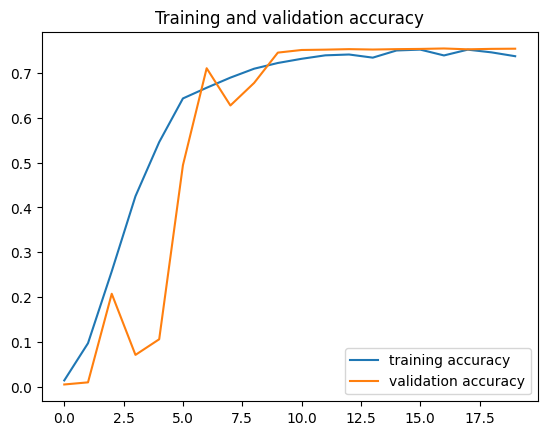

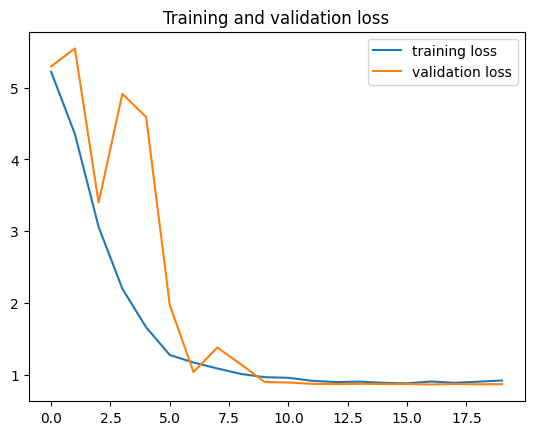

In [ ]:
## Accuracy and Loss plots
import matplotlib.pyplot as plt

accuracy      = history.history['accuracy']
val_accuracy  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy)) # Get number of epochs

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')


**1) Accuracy Plot:**

* **Training Accuracy:** The training accuracy plot shows how well the model is performing on the training data over epochs. It measures the proportion of correctly classified samples in the training set. Ideally, we want to see an increasing trend, indicating that the model is learning the underlying patterns in the data.

* **Validation Accuracy:** The validation accuracy plot indicates the model's performance on unseen data, usually a validation set. It shows how well the model is generalizing to new examples. A rising validation accuracy suggests that the model is not overfitting and is able to generalize to unseen data effectively.

**2) Loss Plot:**

* **Training Loss:** The training loss plot shows the value of the loss function (in this case, categorical cross-entropy) on the training data over epochs. It measures the difference between the model's predicted probabilities and the actual labels. A decreasing training loss indicates that the model is improving in minimizing this difference.

* **Validation Loss:** The validation loss plot measures the loss on the validation set. It provides insights into how well the model is generalizing to unseen data. A decreasing validation loss suggests that the model is not overfitting and is able to generalize well.

**3) Overall Insights:**

* **Model Performance:** Look for consistency between the training and validation accuracy/loss. If the validation accuracy/loss starts diverging from the training accuracy/loss, it could indicate overfitting (if validation metrics worsen) or poor generalization (if validation metrics don't improve).

* **Model Convergence:** Check if the training and validation metrics converge or stabilize after a certain number of epochs. Convergence indicates that the model has learned as much as it can from the data provided. If the metrics continue to improve, consider training for more epochs.

* **Hyperparameter Tuning:** If the model's performance is not satisfactory, consider adjusting hyperparameters such as learning rate, dropout rate, or layer sizes. Fine-tuning these hyperparameters can significantly impact the model's performance.

In [ ]:
# Performance of Efficient Net Model
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
import numpy as np
test_set = test_datagen.flow_from_directory('C:\\Users\\adity\\Downloads\\capstone\\Car Images\\Test Images\\',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            shuffle=False,
                                            class_mode = 'categorical')

# Predict the whole generator to get predictions
Y_pred = EffNet_model.predict_generator(test_set, int(8041/16+1))

# Find out the predictions classes with maximum probability
y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data.
print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 8041 images belonging to 196 classes.


C:\Users\adity\AppData\Local\Temp\ipykernel_12568\1874819283.py:11: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = EffNet_model.predict_generator(test_set, int(8041/16+1))


[[42  0  0 ...  0  0  0]
 [ 0 32  0 ...  0  0  0]
 [ 0  0 11 ...  0  0  0]
 ...
 [ 0  0  0 ... 33  0  0]
 [ 0  0  0 ...  0 29  0]
 [ 0  0  0 ...  0  0 32]]
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.78      0.95      0.86        44
                             Acura Integra Type R 2001       0.70      0.73      0.71        44
                                   Acura RL Sedan 2012       0.52      0.34      0.42        32
                                   Acura TL Sedan 2012       0.68      0.88      0.77        43
                                  Acura TL Type-S 2008       0.71      0.69      0.70        42
                                  Acura TSX Sedan 2012       0.69      0.55      0.61        40
                              Acura ZDX Hatchback 2012       0.76      0.79      0.78        39
              Aston Martin V8 Vantage Convertible 2012       0.51      0.67

In [ ]:
img_size = 224
num_class = 196
def batch_generator(df, model_used="efficientnet", batch_size=32):

    while True:

        #Create indexes
        image_nums = np.random.randint(0,df.shape[0], size=batch_size)

        #Create empty arrays
        #1. To hold image input
        batch_images = np.zeros(shape=(batch_size, img_size, img_size, 3))

        #Classification Labels
        batch_labels = np.zeros(shape=(batch_size, num_class))

        #Regression labels - 4 numbers per example image
        batch_bboxes = np.zeros(shape=(batch_size, 4))


        for i in range(batch_size):

            #Read image and resize
            img = tf.keras.preprocessing.image.load_img(df.loc[image_nums[i], 'path'],
                                                        target_size=(img_size, img_size))

            #Convert to numpy array
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            #Update batch
            batch_images[i] = img_array

            #Read image classification label & convert to one hot vector
            # cl_label = master_df.loc[image_nums[i], 'label']
            cl_label = df['label']
            cl_label = tf.keras.utils.to_categorical(np.asarray(cl_label.factorize()[0]), num_classes=num_class)
            batch_labels[i] = cl_label[i]
            # to_categorical(np.asarray(y_train.factorize()[0]))

            #Read and resize bounding box co-ordinates
            img_width = df.loc[image_nums[i], 'width']
            img_height = df.loc[image_nums[i], 'height']

            xmin = df.loc[image_nums[i], 'x_min'] * img_size/img_width
            xmax = df.loc[image_nums[i], 'x_max'] * img_size/img_width

            ymin = df.loc[image_nums[i], 'y_min'] * img_size/img_height
            ymax = df.loc[image_nums[i], 'y_max'] * img_size/img_height

            #We will ask model to predict xmin, ymin, width and height of bounding box
            batch_bboxes[i] = [xmin, ymin, xmax-xmin, ymax-ymin]

        #Normalize batch images as per Pre-trained model to be used
        for i in range(batch_size):
            if model_used == "resnet":
                batch_images[i] = tf.keras.applications.resnet.preprocess_input(batch_images[i])
            elif model_used == "mobilenet":
                batch_images[i] = tf.keras.applications.mobilenet.preprocess_input(batch_images[i])
            elif model_used == "efficientnet":
                batch_images[i] = tf.keras.applications.efficientnet.preprocess_input(batch_images[i])

        #Make bounding boxes (x, y, w, h) as numbers between 0 and 1 - this seems to work better
        batch_bboxes = batch_bboxes/img_size

        #Return batch - use yield function to make it a python generator
        yield batch_images, [batch_labels, batch_bboxes]

In [ ]:
# Creating test an train dataframes from master dataframe
train_df = master_df[master_df['source']=='train'].reset_index().drop(columns=['index'])
test_df = master_df[master_df['source']=='test'].reset_index().drop(columns=['index'])

In [ ]:
from sklearn import preprocessing
from keras.utils.np_utils import to_categorical

label_encoder = preprocessing.LabelEncoder()
train_df['label_encode'] = label_encoder.fit_transform(train_df['label'])
test_df['label_encode'] = label_encoder.fit_transform(test_df['label'])

In [ ]:
train_df.columns

Index(['id', 'image', 'label', 'dataset', 'height', 'width', 'n_channels',
       'path', 'source', 'x_min', 'y_min', 'x_max', 'y_max', 'Image class',
       'model_year', 'label_encode'],
      dtype='object')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

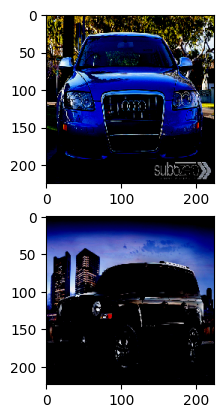

In [ ]:
gen = batch_generator(train_df, batch_size=2, model_used="mobilenet")
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1)

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 224, 224, 3)
(2, 196) (2, 4)
[array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
     

<Figure size 1000x400 with 0 Axes>

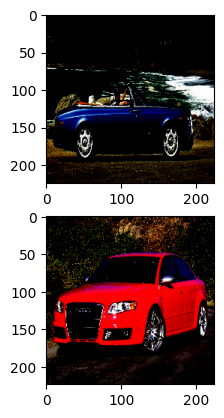

In [ ]:
gen = batch_generator(test_df, batch_size=2, model_used="mobilenet")
X, y = next(gen)
print(X.shape)
print(y[0].shape, y[1].shape)
print(y)

ll1111 = []
# label_encoder.inverse_transform(y[0][0])
for i in range(0,len(y[0])):
  y1 = int(np.argmax(y[0][i], axis=-1))
  ll1111.extend([y1])

print(len(ll1111))
print(label_encoder.inverse_transform(ll1111))

plt.figure(figsize =(10, 4))

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(y[0]),1)

for i in range(0,len(y[0])):
  axarr[i].imshow(X[i])

In [ ]:
def calculate_iou(y_true, y_pred):


    """
    Input:
    Keras provides the input as numpy arrays with shape (batch_size, num_columns).

    Arguments:
    y_true -- first box, numpy array with format [x, y, width, height, conf_score]
    y_pred -- second box, numpy array with format [x, y, width, height, conf_score]
    x any y are the coordinates of the top left corner of each box.

    Output: IoU of type float32. (This is a ratio. Max is 1. Min is 0.)

    """


    results = []

    for i in range(0,y_true.shape[0]):

        # set the types so we are sure what type we are using
        y_true = np.array(y_true, dtype=np.float32)
        y_pred = np.array(y_pred, dtype=np.float32)

        #print(y_true.shape)
        #print(y_pred.shape)
        # boxTrue
        x_boxTrue_tleft = y_true[i,0]  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        x_boxPred_tleft = y_pred[i,0]
        y_boxPred_tleft = y_pred[i,1]
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        area_boxPred = (boxPred_width * boxPred_height)

        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br])

        # Calculate the area of boxInt, i.e. the area of the intersection
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.


        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)


        # This must match the type used in py_func
        iou = np.array(iou, dtype=np.float32)

        # append the result to a list at the end of each loop
        results.append(iou)

    # return the mean IoU score for the batch
    return np.mean(results)



def IoU(y_true, y_pred):

    # Note: the type float32 is very important. It must be the same type as the output from
    # the python function above or you too may spend many late night hours
    # trying to debug and almost give up.

    iou = tf.py_function(calculate_iou, [y_true, y_pred], tf.float32)

    return iou

# **Mobile Net with Regression**

In [ ]:
# Mobile Net with Faster RCNN

from tensorflow.keras.applications.mobilenet import MobileNet

model = MobileNet(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

#Freeze all the layers
for layer in model.layers:
        layer.trainable = True

#get Output layer of Pre-trained model
x1 = model.output

#Pooling layer
x2 = GlobalAveragePooling2D()(x1)

#Flatten the output to feed to Dense layer
x3 = Dropout(0.2)(x2)

#Add one Dense layer
x4_1 = Dense(1024, activation='relu')(x3)

x4_2 = Dropout(0.15)(x4_1)

#Add one Dense layer
x4_3 = Dense(512, activation='relu')(x4_2)

x4_4 = Dropout(0.05)(x4_3)

#Add one Dense layer
x4 = Dense(256, activation='relu')(x4_4)

#Batch Norm
x5 = BatchNormalization()(x4)

#Print the number of classes
print(num_class)
#Classification
label_output = Dense(num_class, activation='softmax', name='class_op')(x5)

196


In [ ]:
model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                         

In [ ]:
len(model.layers)

86

In [ ]:
model.output

<KerasTensor: shape=(None, 7, 7, 1024) dtype=float32 (created by layer 'conv_pw_13_relu')>

In [ ]:
label_output

<KerasTensor: shape=(None, 196) dtype=float32 (created by layer 'class_op')>

In [ ]:
#Regression
bbox_output = Dense(4, activation='sigmoid', name='reg_op')(x5)

In [ ]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

In [ ]:
#Non Sequential model as it has two different outputs
final_model = Model(inputs=model.input, #Pre-trained model input as input layer
                    outputs=[label_output,bbox_output]) #Output layer added

In [ ]:
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 32  128         ['conv1[0][0]']                  
                                )                                                             

In [ ]:
optimizerVar = Adam(lr=0.0001)
final_model.compile(optimizer=optimizerVar,
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
#Create train and test generator
batchsize = 16
train_generator = batch_generator(train_df, batch_size=batchsize, model_used='mobilenet') #batchsize can be changed
test_generator = batch_generator(test_df, batch_size=batchsize, model_used='mobilenet')

In [ ]:
history_1 = final_model.fit(train_generator,
                epochs=20,
                steps_per_epoch= train_df.shape[0]//batchsize,
                validation_data=test_generator,
                validation_steps = test_df.shape[0]//batchsize)

Epoch 1/20
509/509 [==============================] - 130s 234ms/step - loss: 5.4988 - class_op_loss: 5.3736 - reg_op_loss: 0.1251 - class_op_accuracy: 0.0248 - reg_op_IoU: 0.1835 - val_loss: 4.9699 - val_class_op_loss: 4.9315 - val_reg_op_loss: 0.0385 - val_class_op_accuracy: 0.0647 - val_reg_op_IoU: 0.4362
Epoch 2/20
509/509 [==============================] - 119s 234ms/step - loss: 4.3058 - class_op_loss: 4.2691 - reg_op_loss: 0.0367 - class_op_accuracy: 0.0608 - reg_op_IoU: 0.4728 - val_loss: 3.5415 - val_class_op_loss: 3.5300 - val_reg_op_loss: 0.0116 - val_class_op_accuracy: 0.0600 - val_reg_op_IoU: 0.6797
Epoch 3/20
509/509 [==============================] - 119s 234ms/step - loss: 3.1601 - class_op_loss: 3.1479 - reg_op_loss: 0.0122 - class_op_accuracy: 0.0593 - reg_op_IoU: 0.6803 - val_loss: 2.9255 - val_class_op_loss: 2.9146 - val_reg_op_loss: 0.0109 - val_class_op_accuracy: 0.0621 - val_reg_op_IoU: 0.7134
Epoch 4/20
509/509 [==============================] - 127s 249ms/step 

In [ ]:
final_model.save('./mob_model_rcnn.h5')
final_model.save_weights('./mob_model_rcnn.h5')

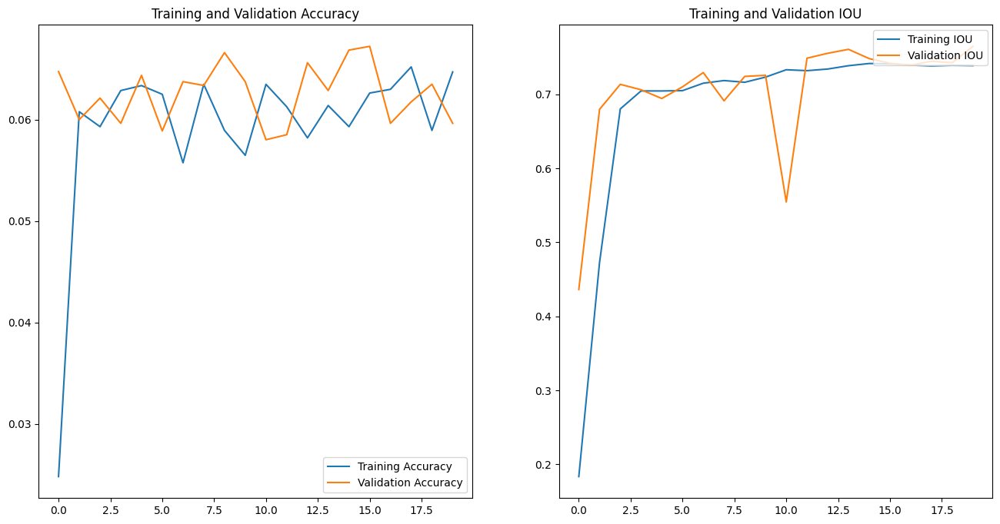

In [ ]:
acc = history_1.history['class_op_accuracy']
val_acc = history_1.history['val_class_op_accuracy']

iou = history_1.history['reg_op_IoU']
val_iou = history_1.history['val_reg_op_IoU']

epochs_range = range(20)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

**Insights:**

**1) Training and Validation Accuracy:**

* **Training Accuracy:** The plot shows how accurately the model predicts the classes of objects in the training data as training progresses. Ideally, this should increase or plateau over epochs.

* **Validation Accuracy:** This curve reflects how well the model generalizes to unseen data. It is crucial to ensure that validation accuracy increases or remains stable alongside training accuracy. A significant gap between training and validation accuracy may indicate overfitting.

**2) Training and Validation IOU:**

* **Training IOU:** IOU measures the overlap between predicted bounding boxes and ground truth boxes. A higher IOU indicates better localization accuracy.

* **Validation IOU:** Similar to validation accuracy, this metric evaluates the model's ability to generalize bounding box predictions to unseen data.

**3) Overall Insights:**

* **Model Performance:** Assess the consistency and convergence of both accuracy and IOU metrics to gauge the overall performance of the model.
* **Overfitting:** Watch out for signs of overfitting, such as a significant gap between training and validation metrics or a decrease in validation metrics after a certain point.
* **Generalization:** Ensure that the model generalizes well to unseen data by monitoring validation metrics alongside training metrics.

## Model Prediction

In [ ]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'path'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.mobilenet.preprocess_input(input_array)

    #Prediction
    pred = final_model.predict(input_array)
    pred_1 = MobileNet_model.predict(input_array)

    #Get classification and regression predictions
    label_pred, bbox_pred = pred_1, pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Image class']
    act_class = df.loc[image_num, 'label']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['x_min', 'y_min', 'x_max', 'y_max']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)

    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'path'])

    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin),
                        (xmax, ymax), (0,0,255), 3)

    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)),
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                       )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 0s 24ms/step
Real Label : Spyker C8 Convertible 2009 
Predicted Label:  Scion xD Hatchback 2012


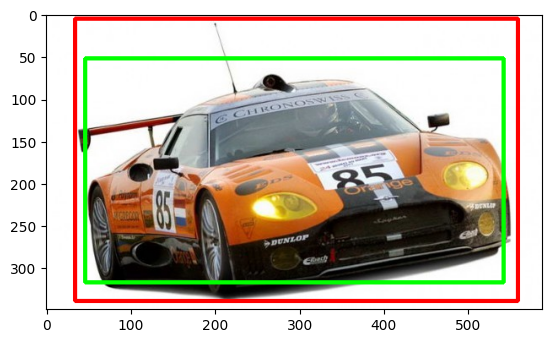

1/1 [==============================] - 0s 26ms/step
Real Label : Jeep Liberty SUV 2012 
Predicted Label:  Jeep Liberty SUV 2012


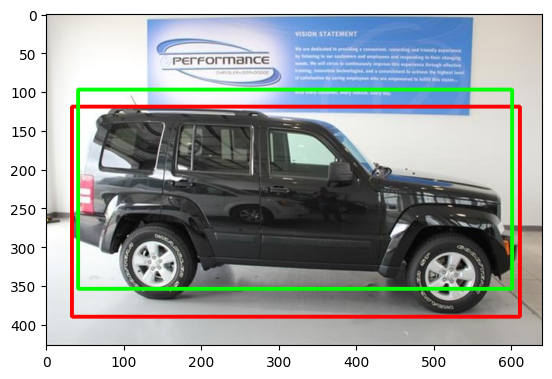

1/1 [==============================] - 0s 24ms/step
Real Label : Acura Integra Type R 2001 
Predicted Label:  AM General Hummer SUV 2000


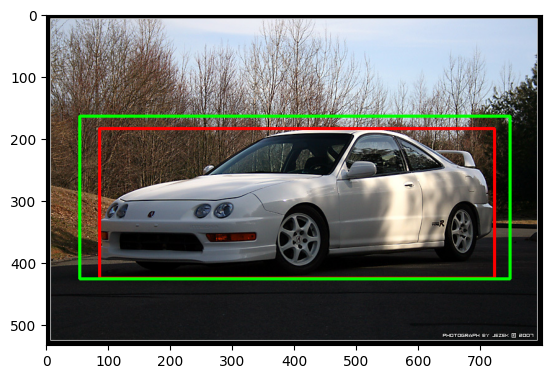

1/1 [==============================] - 0s 24ms/step
Real Label : Bugatti Veyron 16.4 Convertible 2009 
Predicted Label:  Bentley Continental Flying Spur Sedan 2007


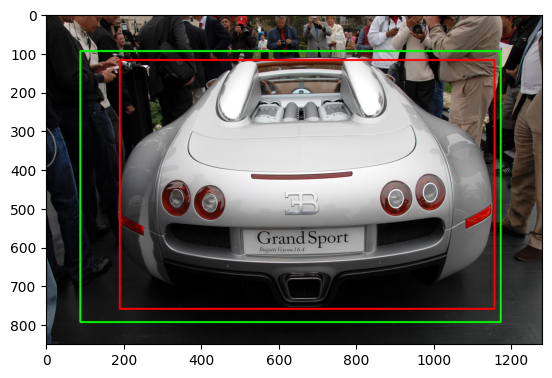

1/1 [==============================] - 0s 25ms/step
Real Label : Mercedes-Benz SL-Class Coupe 2009 
Predicted Label:  Mercedes-Benz E-Class Sedan 2012


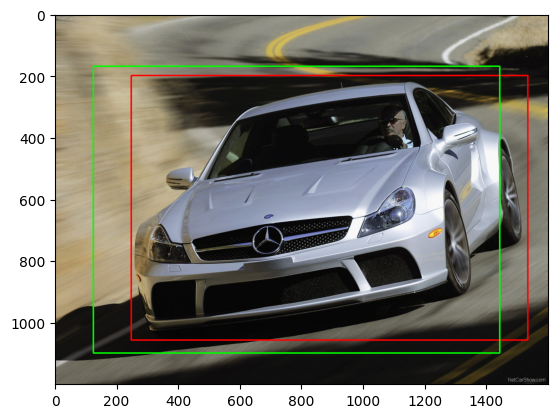

In [ ]:
#Predict on Test Dataset
label_class_dict = dict(zip(test_df['Image class'], test_df['label']))
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

1/1 [==============================] - 0s 27ms/step
Real Label : Chevrolet Silverado 2500HD Regular Cab 2012 
Predicted Label:  Chevrolet Silverado 1500 Classic Extended Cab 2007


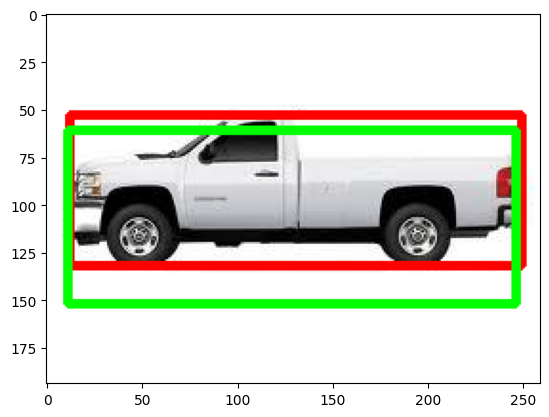

1/1 [==============================] - 0s 27ms/step
Real Label : Audi S5 Coupe 2012 
Predicted Label:  Audi A5 Coupe 2012


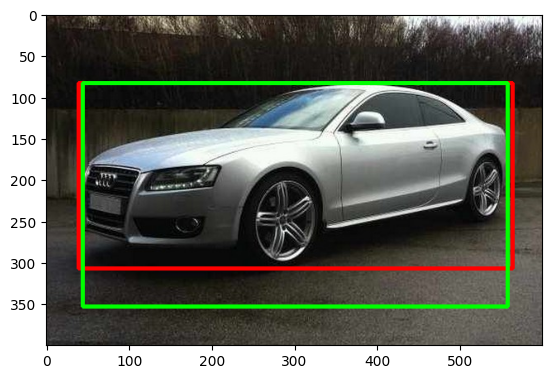

1/1 [==============================] - 0s 28ms/step
Real Label : Chevrolet Traverse SUV 2012 
Predicted Label:  Hyundai Elantra Touring Hatchback 2012


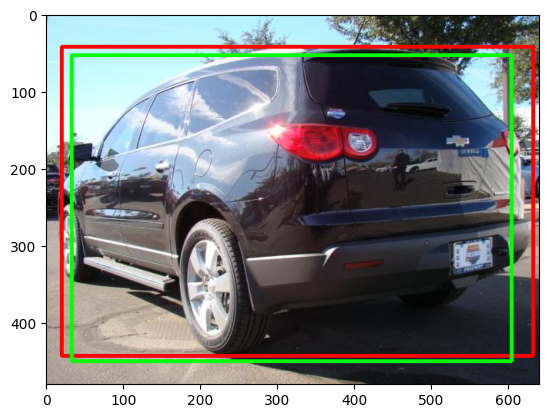

1/1 [==============================] - 0s 23ms/step
Real Label : Volvo C30 Hatchback 2012 
Predicted Label:  Volvo C30 Hatchback 2012


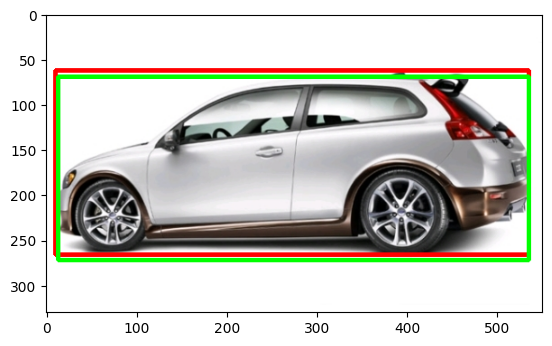

1/1 [==============================] - 0s 21ms/step
Real Label : Dodge Charger Sedan 2012 
Predicted Label:  Dodge Caravan Minivan 1997


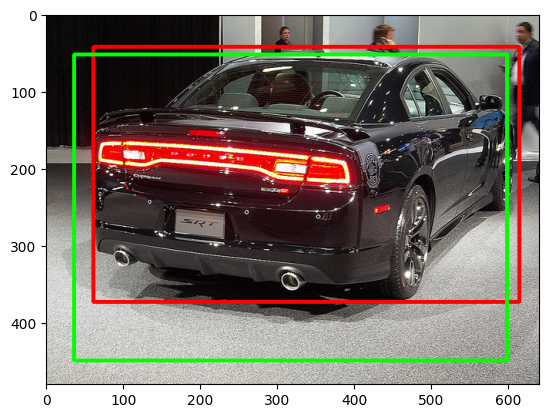

In [ ]:
#Predict on Test Dataset
label_class_dict = dict(zip(test_df['Image class'], test_df['label']))
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [ ]:
test_df.columns

Index(['id', 'image', 'label', 'dataset', 'height', 'width', 'n_channels',
       'path', 'source', 'x_min', 'y_min', 'x_max', 'y_max', 'Image class',
       'model_year', 'label_encode'],
      dtype='object')

In [ ]:
testData_generator = batch_generator(test_df, batch_size=8, model_used='mobilenet')
print('Evaluating')
# Re-evaluate the model
test_results = final_model.evaluate(testData_generator, verbose=1, batch_size = 16, steps = 509, return_dict = True)
acc = test_results['reg_op_IoU']
print("Restored model, IOU: {:5.2f}%".format(100 * acc))

Evaluating
509/509 [==============================] - 34s 67ms/step - loss: 2.7859 - class_op_loss: 2.7793 - reg_op_loss: 0.0066 - class_op_accuracy: 0.0444 - reg_op_IoU: 0.7623
Restored model, IOU: 76.23%


In [ ]:
print(test_results)

{'loss': 2.7852208614349365, 'class_op_loss': 2.778623104095459, 'reg_op_loss': 0.006596399936825037, 'class_op_accuracy': 0.04076620936393738, 'reg_op_IoU': 0.7596479058265686}


# **Efficient Net with Regression**

In [ ]:
# Efficient Net with Faster RCNN

from tensorflow.keras.applications.efficientnet import EfficientNetB0

model_2 = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

#Freeze all the layers
for layer in model.layers:
        layer.trainable = True

#get Output layer of Pre-trained model
x1 = model_2.output

#Pooling layer
x2 = GlobalAveragePooling2D()(x1)

#Flatten the output to feed to Dense layer
x3 = Dropout(0.2)(x2)

#Add one Dense layer
x4_1 = Dense(1024, activation='relu')(x3)

x4_2 = Dropout(0.15)(x4_1)

#Add one Dense layer
x4_3 = Dense(512, activation='relu')(x4_2)

x4_4 = Dropout(0.05)(x4_3)

#Add one Dense layer
x4 = Dense(256, activation='relu')(x4_4)

#Batch Norm
x5 = BatchNormalization()(x4)

#Print the number of classes
print(num_class)
#Classification
label_output = Dense(num_class, activation='softmax', name='class_op')(x5)

196


In [ ]:
model_2.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0

In [ ]:
len(model_2.layers)

238

In [ ]:
model_2.output

<KerasTensor: shape=(None, 7, 7, 1280) dtype=float32 (created by layer 'top_activation')>

In [ ]:
label_output

<KerasTensor: shape=(None, 196) dtype=float32 (created by layer 'class_op')>

In [ ]:
#Regression
bbox_output = Dense(4, activation='sigmoid', name='reg_op')(x3)

In [ ]:
bbox_output

<KerasTensor: shape=(None, 4) dtype=float32 (created by layer 'reg_op')>

In [ ]:
#Non Sequential model as it has two different outputs
final_model_2 = Model(inputs=model_2.input, #Pre-trained model input as input layer
                    outputs=[label_output,bbox_output]) #Output layer added

In [ ]:
final_model_2.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']    

In [ ]:
optimizerVar = Adam(lr=0.0001)
final_model_2.compile(optimizer=optimizerVar,
                    loss={'reg_op':'mse', 'class_op':'categorical_crossentropy'},
                    metrics={'reg_op':[IoU], 'class_op':['accuracy']})

C:\Users\adity\miniconda3\envs\capstone\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
#Create train and test generator
batchsize = 16
train_generator = batch_generator(train_df, batch_size=batchsize, model_used='efficientnet') #batchsize can be changed
test_generator = batch_generator(test_df, batch_size=batchsize, model_used='efficientnet')

In [ ]:
history_2 = final_model_2.fit(train_generator,
                epochs=20,
                steps_per_epoch= train_df.shape[0]//batchsize,
                validation_data=test_generator,
                validation_steps = test_df.shape[0]//batchsize)

Epoch 1/20
509/509 [==============================] - 215s 401ms/step - loss: 5.4026 - class_op_loss: 5.3692 - reg_op_loss: 0.0334 - class_op_accuracy: 0.0255 - reg_op_IoU: 0.5357 - val_loss: 5.0016 - val_class_op_loss: 4.9788 - val_reg_op_loss: 0.0228 - val_class_op_accuracy: 0.0574 - val_reg_op_IoU: 0.5929
Epoch 2/20
509/509 [==============================] - 203s 400ms/step - loss: 4.3734 - class_op_loss: 4.3563 - reg_op_loss: 0.0171 - class_op_accuracy: 0.0602 - reg_op_IoU: 0.6263 - val_loss: 3.6661 - val_class_op_loss: 3.6521 - val_reg_op_loss: 0.0139 - val_class_op_accuracy: 0.0595 - val_reg_op_IoU: 0.6538
Epoch 3/20
509/509 [==============================] - 203s 400ms/step - loss: 3.1905 - class_op_loss: 3.1771 - reg_op_loss: 0.0134 - class_op_accuracy: 0.0596 - reg_op_IoU: 0.6479 - val_loss: 2.9690 - val_class_op_loss: 2.9578 - val_reg_op_loss: 0.0112 - val_class_op_accuracy: 0.0615 - val_reg_op_IoU: 0.6667
Epoch 4/20
509/509 [==============================] - 203s 400ms/step 

In [ ]:
# final_model_2.save('./eff_model_rcnn.h5')
final_model_2.save_weights('./eff_model_rcnn.h5')

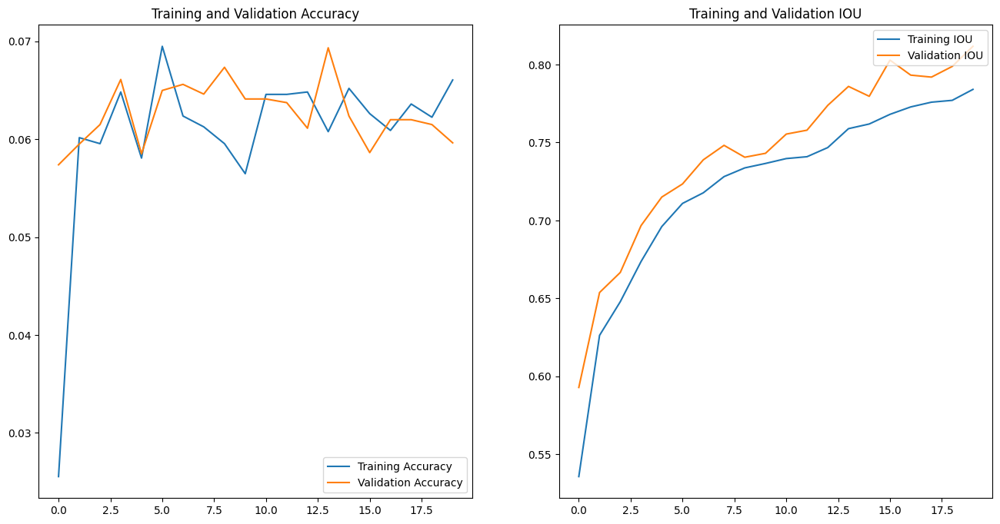

In [ ]:
acc = history_2.history['class_op_accuracy']
val_acc = history_2.history['val_class_op_accuracy']

iou = history_2.history['reg_op_IoU']
val_iou = history_2.history['val_reg_op_IoU']

epochs_range = range(20)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, iou, label='Training IOU')
plt.plot(epochs_range, val_iou, label='Validation IOU')
plt.legend(loc='upper right')
plt.title('Training and Validation IOU')
plt.show()

**Insights:**

**1) Accuracy Plot:**

* **Training Accuracy:** The training accuracy increases steadily over epochs, indicating that the model is learning from the training data and improving its ability to classify objects accurately.
* **Validation Accuracy:** Initially, the validation accuracy shows an increasing trend, suggesting that the model generalizes well to unseen data. However, it seems to fluctuate later on, which could indicate some instability or overfitting.

**2) IOU Plot:**

* **Training IOU:** The training IOU increases over epochs, indicating that the model is improving its ability to localize objects accurately.
* **Validation IOU:** Similar to validation accuracy, the validation IOU shows fluctuations, possibly indicating overfitting or instability.

**3) Overall Insights:**

* The model demonstrates an overall positive trend in both training accuracy and training IOU, indicating effective learning and improvement in object classification and localization.
* However, fluctuations in validation accuracy and IOU suggest potential issues with model generalization or stability, which may require further investigation and refinement of the model architecture or training process.

In [ ]:
def predict_and_draw(image_num, df):

    #Load image
    img = tf.keras.preprocessing.image.load_img(df.loc[image_num, 'path'])
    w, h = img.size

    #Prepare input for model
    #1. Resize image
    img_resized = img.resize((img_size, img_size))
    #2. Conver to array and make it a batch of 1
    input_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    input_array = np.expand_dims(input_array, axis=0)

    #3. Normalize image data
    input_array = tf.keras.applications.efficientnet.preprocess_input(input_array)

    #Prediction
    pred = final_model_2.predict(input_array)
    pred_1 = EffNet_model.predict(input_array)
    #Get classification and regression predictions
    label_pred, bbox_pred = pred_1, pred[1][0]
    #Get Label with highest probability
    pred_class = label_class_dict[np.argmax(label_pred)]

    #Read actual label and bounding box
    act_class = df.loc[image_num, 'Image class']
    act_class = df.loc[image_num, 'label']
    xmin, ymin, xmax, ymax = df.loc[image_num, ['x_min', 'y_min', 'x_max', 'y_max']]

    print('Real Label :', act_class, '\nPredicted Label: ', pred_class)

    #Draw bounding boxes - Actual (Red) and Predicted(Green)
    img = cv2.imread(df.loc[image_num, 'path'])

    #Draw actual bounding box - Red
    img = cv2.rectangle(img, (xmin, ymin),
                        (xmax, ymax), (0,0,255), 3)

    #Draw predicted bounding box -  Green
    img = cv2.rectangle(img, (int(bbox_pred[0]*w), int(bbox_pred[1]*h)),
                        (int((bbox_pred[0]+bbox_pred[2])*w), int((bbox_pred[1]+bbox_pred[3])*h)), (0,255,0), 3
                       )

    #Display the picture
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

1/1 [==============================] - 0s 31ms/step
Real Label : Ford Mustang Convertible 2007 
Predicted Label:  Dodge Ram Pickup 3500 Quad Cab 2009


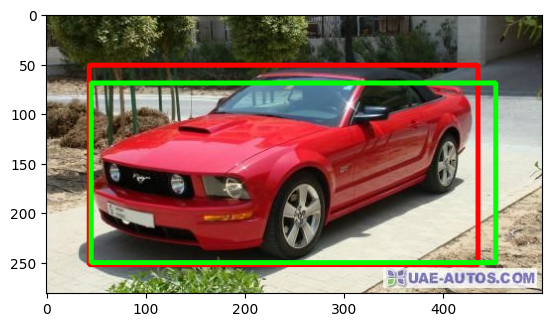

1/1 [==============================] - 0s 31ms/step
Real Label : Buick Rainier SUV 2007 
Predicted Label:  BMW 3 Series Sedan 2012


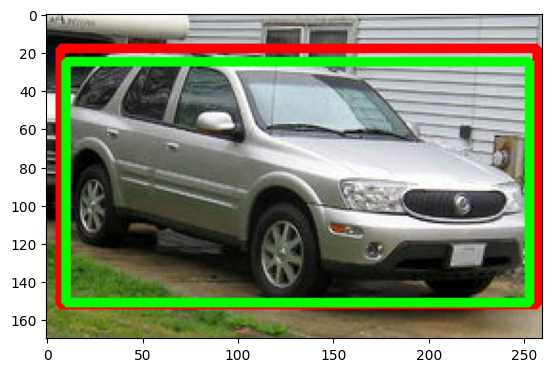

1/1 [==============================] - 0s 32ms/step
Real Label : Acura TL Type-S 2008 
Predicted Label:  Chevrolet Malibu Hybrid Sedan 2010


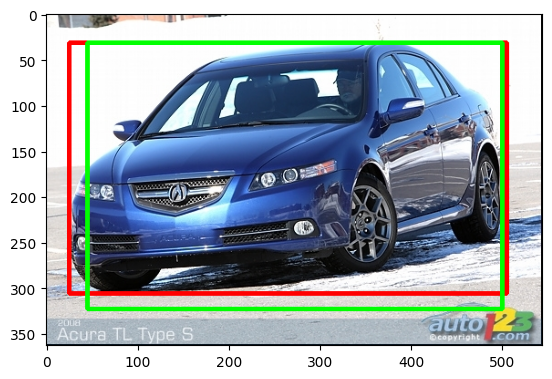

1/1 [==============================] - 0s 28ms/step
Real Label : Chevrolet Monte Carlo Coupe 2007 
Predicted Label:  Chevrolet Corvette Convertible 2012


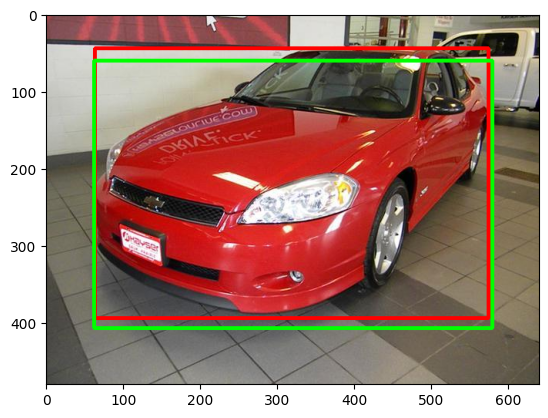

1/1 [==============================] - 0s 27ms/step
Real Label : Acura Integra Type R 2001 
Predicted Label:  Chrysler 300 SRT-8 2010


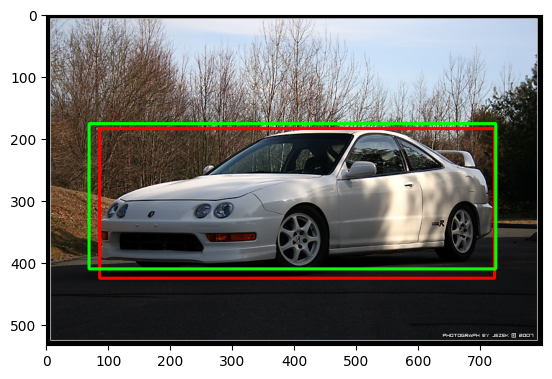

In [ ]:
#Predict on Test Dataset
for i in range(0,5):
  image_num = np.random.randint(0, test_df.shape[0])
  predict_and_draw(image_num, test_df)

In [ ]:
testData_generator = batch_generator(test_df, batch_size=8, model_used='efficientnet')
print('Evaluating')
# Re-evaluate the model
test_results_2 = final_model_2.evaluate(testData_generator, verbose=1, batch_size = 16, steps = 509, return_dict = True)
acc = test_results_2['reg_op_IoU']
print("Restored model, IOU: {:5.2f}%".format(100 * acc))

Evaluating
509/509 [==============================] - 33s 65ms/step - loss: 2.7863 - class_op_loss: 2.7829 - reg_op_loss: 0.0034 - class_op_accuracy: 0.0570 - reg_op_IoU: 0.8102
Restored model, IOU: 81.02%


## Pickling the models for future use

In [ ]:
import pickle
pickle.dump(model, open('model_0.pkl', 'wb'))
pickle.dump(model, open('model_1.pkl', 'wb'))
pickle.dump(model, open('model_2.pkl', 'wb'))
pickle.dump(model, open('ResNet_model.pkl', 'wb'))
pickle.dump(model, open('MobileNet_model.pkl', 'wb'))
pickle.dump(model, open('EffNet_model.pkl', 'wb'))
pickle.dump(model, open('final_model.pkl', 'wb')) # MobileNet with Regression
pickle.dump(model, open('final_model_2.pkl', 'wb')) # EfficientNet with Regression

## Conclusion
We built a number of model architectures using different methodologies ranging from basic CNN models to using transfer learning in combination with Faster RCNN. Out of all the models, we found mobile net with Fast RCNN to perform the best, providing a good balance between accuracy of the class the showing good results in the regression part having very similar bounding box with the actual one. In future, we will me trying my more advance algorithms like YOLOv5 and SSD as well.